# XAI Group 77 Final Code  

## Chrysanthi Foti
## Eleftherios Tetteris
## Nikolaos Athanasopoulos

# Necessary Installs

#### Please un-comment the following cells and run them

In [141]:
#!pip install lime

In [142]:
#!pip install shap

In [143]:
#!pip install alibi

In [144]:
#!pip install anchor-exp

In [145]:
#!pip install xgboost

# Imports

In [146]:
# Import Libraries
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import plotly.offline as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
py.init_notebook_mode(connected=True) 
import plotly.graph_objs as go 
import plotly.tools as tls 
from collections import Counter

from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, fbeta_score, roc_curve, RocCurveDisplay, auc
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score, GridSearchCV, KFold, StratifiedKFold
from sklearn.feature_selection import chi2, mutual_info_classif, SelectKBest, RFE
from sklearn.pipeline import make_pipeline
from scipy.spatial.distance import pdist, squareform

import time
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN

import lime
from lime import lime_tabular
import shap
import random
from anchor import utils
from anchor import anchor_tabular
from alibi.explainers import AnchorTabular
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from tabulate import tabulate




# General Information about dataset

In [147]:
german = pd.read_csv('german_credit_data.csv',index_col=0) 
# Please read the csv with 'index_col = 0' configuration to remove unneccesary column

In [148]:
german.head() 

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
0,67,male,2,own,NaN,little,1169,6,radio/TV,good
1,22,female,2,own,little,moderate,5951,48,radio/TV,bad
2,49,male,1,own,little,NaN,2096,12,education,good
3,45,male,2,free,little,little,7882,42,furniture/equipment,good
4,53,male,2,free,little,little,4870,24,car,bad


In [149]:
german.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Age               1000 non-null   int64 
 1   Sex               1000 non-null   object
 2   Job               1000 non-null   int64 
 3   Housing           1000 non-null   object
 4   Saving accounts   817 non-null    object
 5   Checking account  606 non-null    object
 6   Credit amount     1000 non-null   int64 
 7   Duration          1000 non-null   int64 
 8   Purpose           1000 non-null   object
 9   Risk              1000 non-null   object
dtypes: int64(4), object(6)
memory usage: 85.9+ KB


In [150]:
german.dtypes

Age                  int64
Sex                 object
Job                  int64
Housing             object
Saving accounts     object
Checking account    object
Credit amount        int64
Duration             int64
Purpose             object
Risk                object
dtype: object

In [151]:
german.nunique()

Age                  53
Sex                   2
Job                   4
Housing               3
Saving accounts       4
Checking account      3
Credit amount       921
Duration             33
Purpose               8
Risk                  2
dtype: int64

In [152]:
german.describe(include=['object'])

,Sex,Housing,Saving accounts,Checking account,Purpose,Risk
count,1000,1000,817,606,1000,1000
unique,2,3,4,3,8,2
top,male,own,little,little,car,good
freq,690,713,603,274,337,700


In [153]:
german.describe()

,Age,Job,Credit amount,Duration
count,1000.000000,1000.000000,1000.000000,1000.000000
mean,35.546000,1.904000,3271.258000,20.903000
std,11.375469,0.653614,2822.736876,12.058814
min,19.000000,0.000000,250.000000,4.000000
25%,27.000000,2.000000,1365.500000,12.000000
50%,33.000000,2.000000,2319.500000,18.000000
75%,42.000000,2.000000,3972.250000,24.000000
max,75.000000,3.000000,18424.000000,72.000000


In [154]:
categorical_columns = []
for col in german.select_dtypes(include=[object]):
    print('')
    print(col,":", german[col].unique())
    categorical_columns.append(col)


Sex : ['male' 'female']

Housing : ['own' 'free' 'rent']

Saving accounts : [nan 'little' 'quite rich' 'rich' 'moderate']

Checking account : ['little' 'moderate' nan 'rich']

Purpose : ['radio/TV' 'education' 'furniture/equipment' 'car' 'business'
 'domestic appliances' 'repairs' 'vacation/others']

Risk : ['good' 'bad']


In [155]:
german.isnull().sum().sort_values(ascending=False)

Checking account    394
Saving accounts     183
Age                   0
Sex                   0
Job                   0
Housing               0
Credit amount         0
Duration              0
Purpose               0
Risk                  0
dtype: int64

<AxesSubplot:>

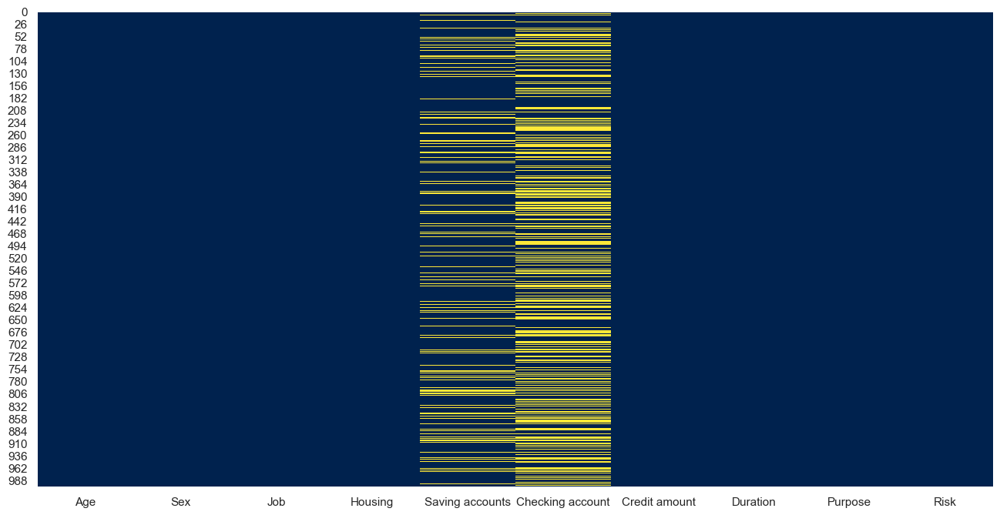

In [156]:
sns.heatmap(german.isnull(), cbar=False, cmap = 'cividis')

In [157]:
german.isnull().sum()

Age                   0
Sex                   0
Job                   0
Housing               0
Saving accounts     183
Checking account    394
Credit amount         0
Duration              0
Purpose               0
Risk                  0
dtype: int64

<BarContainer object of 10 artists>

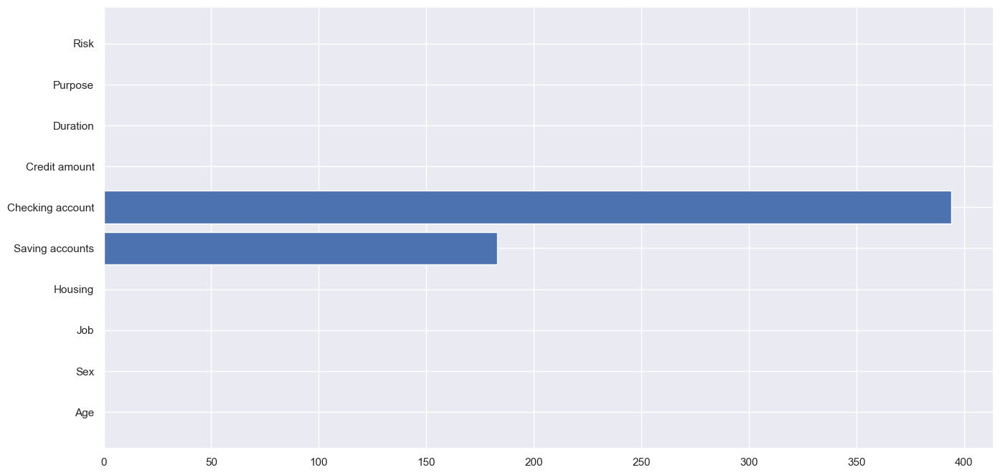

In [158]:
plt.barh(y= german.columns, width = german.isnull().sum())

In [159]:
german['Checking account'].mode()

0    little
Name: Checking account, dtype: object

In [160]:
for col in german.columns:
    print(col)
    print(german[col].mode())
    print('-'*20)

Age
0    27
Name: Age, dtype: int64
--------------------
Sex
0    male
Name: Sex, dtype: object
--------------------
Job
0    2
Name: Job, dtype: int64
--------------------
Housing
0    own
Name: Housing, dtype: object
--------------------
Saving accounts
0    little
Name: Saving accounts, dtype: object
--------------------
Checking account
0    little
Name: Checking account, dtype: object
--------------------
Credit amount
0    1258
1    1262
2    1275
3    1393
4    1478
Name: Credit amount, dtype: int64
--------------------
Duration
0    24
Name: Duration, dtype: int64
--------------------
Purpose
0    car
Name: Purpose, dtype: object
--------------------
Risk
0    good
Name: Risk, dtype: object
--------------------




### Filling nan values with mode

dropping rows or columns leads to worse results, + it potentially introduces bias because we disregard certain aspects of dataset

In [161]:
german = german.fillna(german.mode().iloc[0])
german.head()


,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
0,67,male,2,own,little,little,1169,6,radio/TV,good
1,22,female,2,own,little,moderate,5951,48,radio/TV,bad
2,49,male,1,own,little,little,2096,12,education,good
3,45,male,2,free,little,little,7882,42,furniture/equipment,good
4,53,male,2,free,little,little,4870,24,car,bad


In [162]:
sns.set(rc = {'figure.figsize':(16,8)})


### Correlation matrix between numeric columns only

<AxesSubplot:>

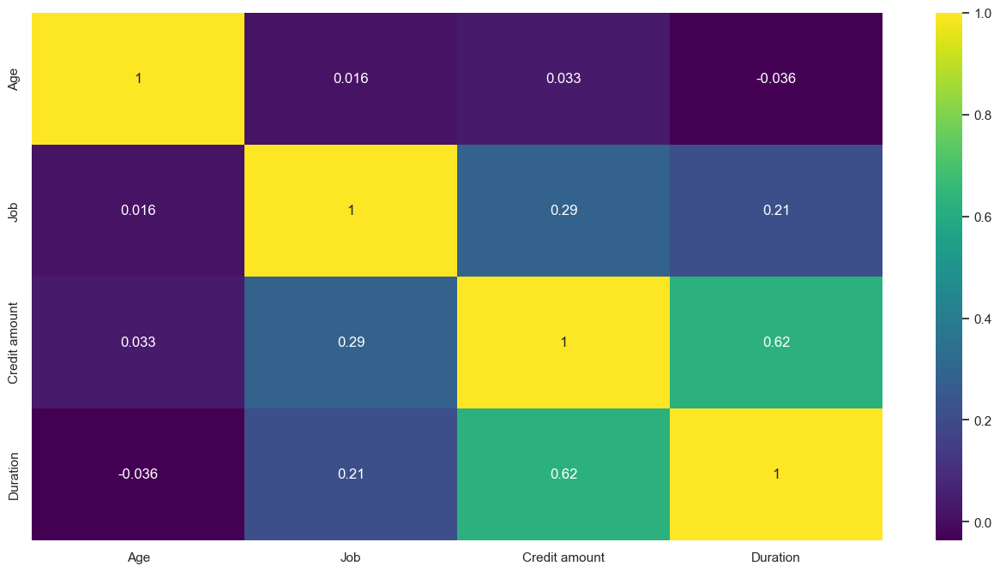

In [163]:
sns.heatmap(german.corr(), annot=True, fmt='.2g', cmap='viridis')

<AxesSubplot:xlabel='Credit amount', ylabel='Duration'>

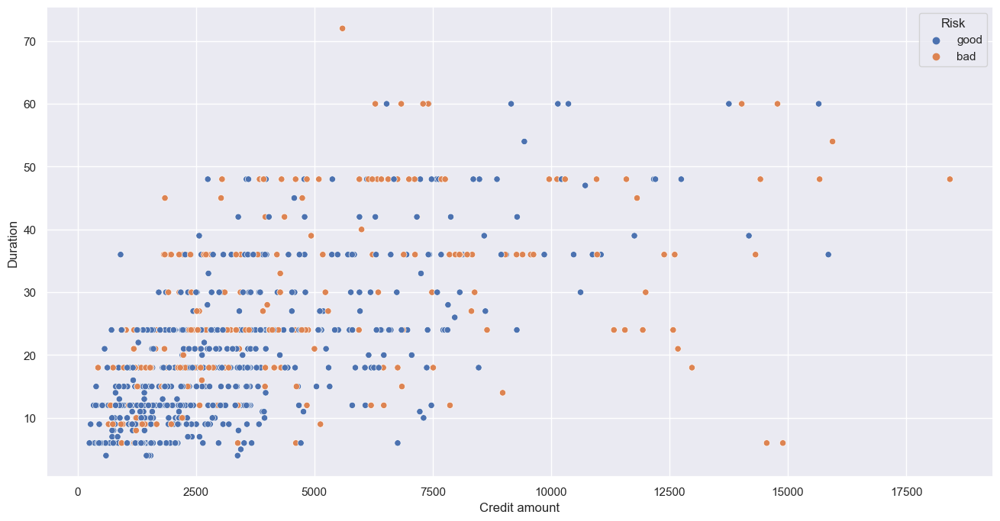

In [164]:
sns.scatterplot(data=german, x="Credit amount", y="Duration", hue="Risk")

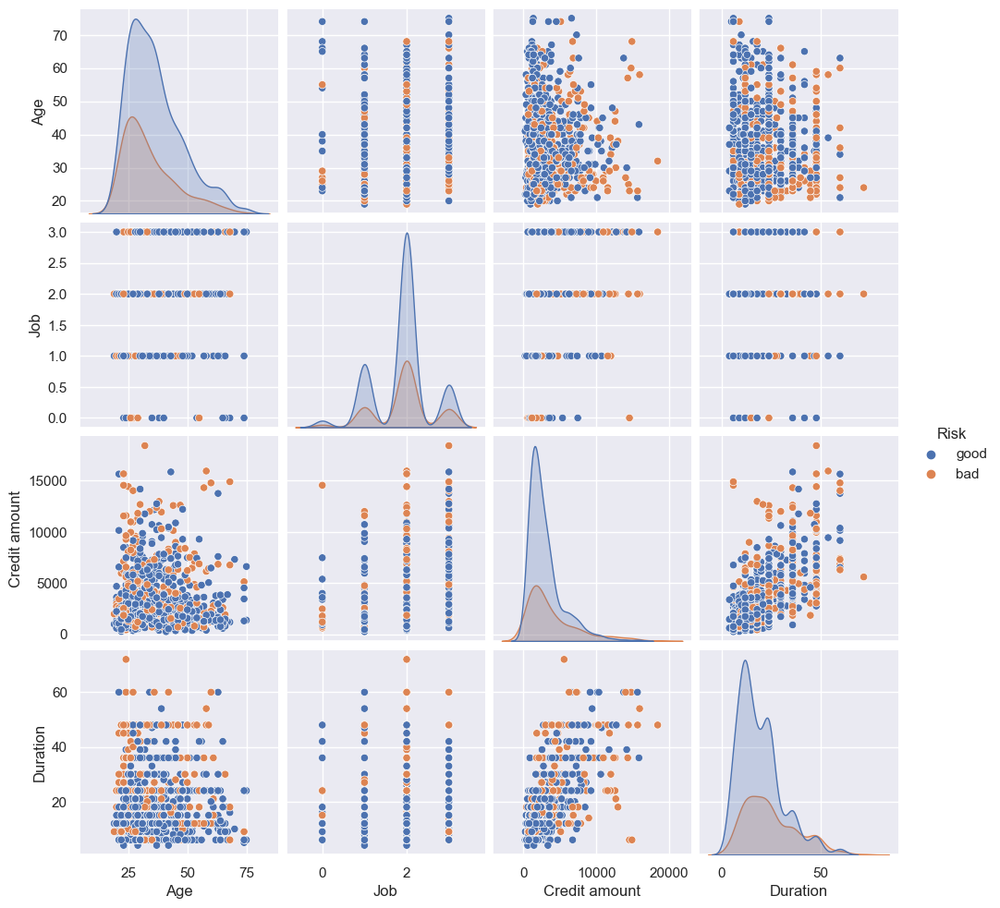

In [165]:
# Interactions between features in the dataset (take a few minutes)
sns.pairplot(german, kind="scatter", diag_kind="kde", hue='Risk')

# Data Distributions

### Distributions for numeric columns

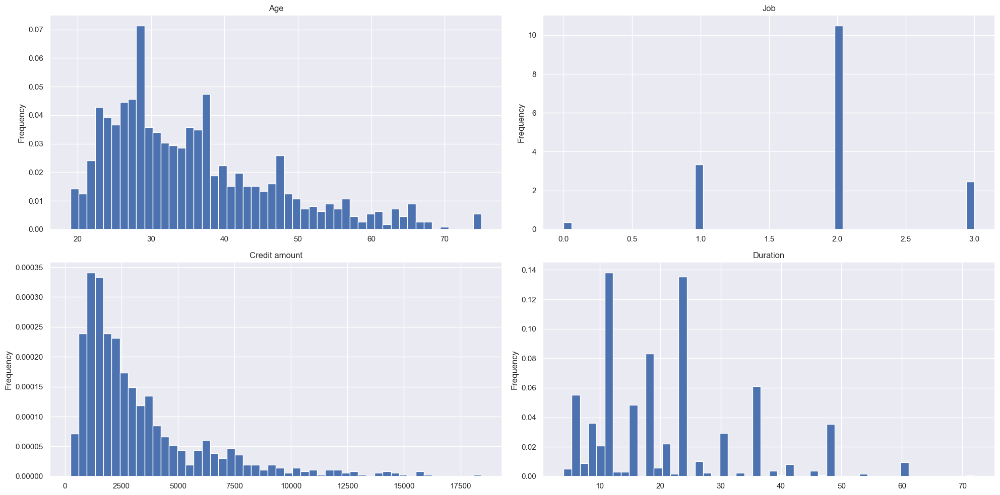

In [166]:
fig, axes = plt.subplots(nrows= 2, ncols = 2, figsize=(20,10))

num_cols = german.select_dtypes(include=['int', 'float']).columns

for i, column in enumerate(num_cols):
    row = i // 2
    col = i % 2 
    german[column].plot.hist(density = True, ax=axes[row, col], bins=50)
    #german[column].plot.kde(ax=axes[row, col])
    axes[row, col].set_title(column)
    
plt.tight_layout()
plt.show()     

<AxesSubplot:xlabel='Job', ylabel='count'>

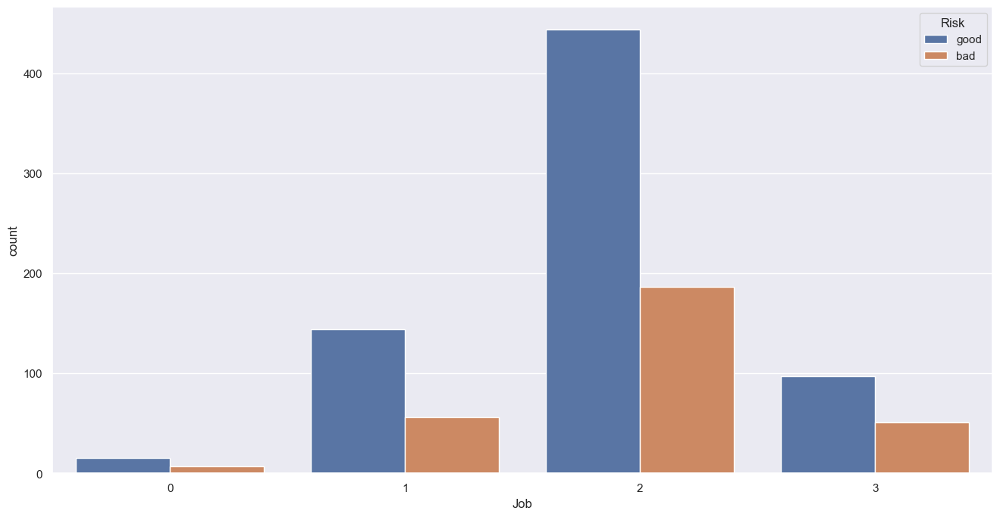

In [167]:
# Countplot for Column Job #

sns.countplot(data=german, x='Job', hue="Risk")


### Distributions for categorical columns

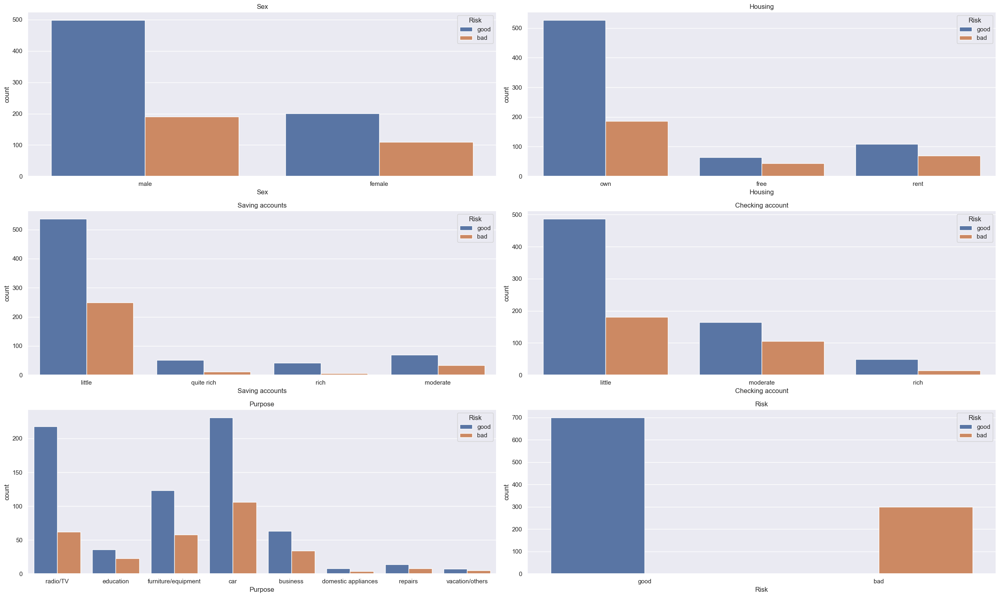

In [168]:
sns.set(font_scale=1)

fig, axes = plt.subplots(nrows= 3, ncols = 2, figsize=(25,15))

cat_cols = german.select_dtypes(include=['object']).columns

for i, column in enumerate(cat_cols):
    row = i // 2
    col = i % 2
    sns.countplot(data=german, x=column, ax=axes[row, col], hue="Risk")
    #german[column].plot.kde(ax=axes[row, col])
    axes[row, col].set_title(column)
    
plt.tight_layout()
plt.show()    

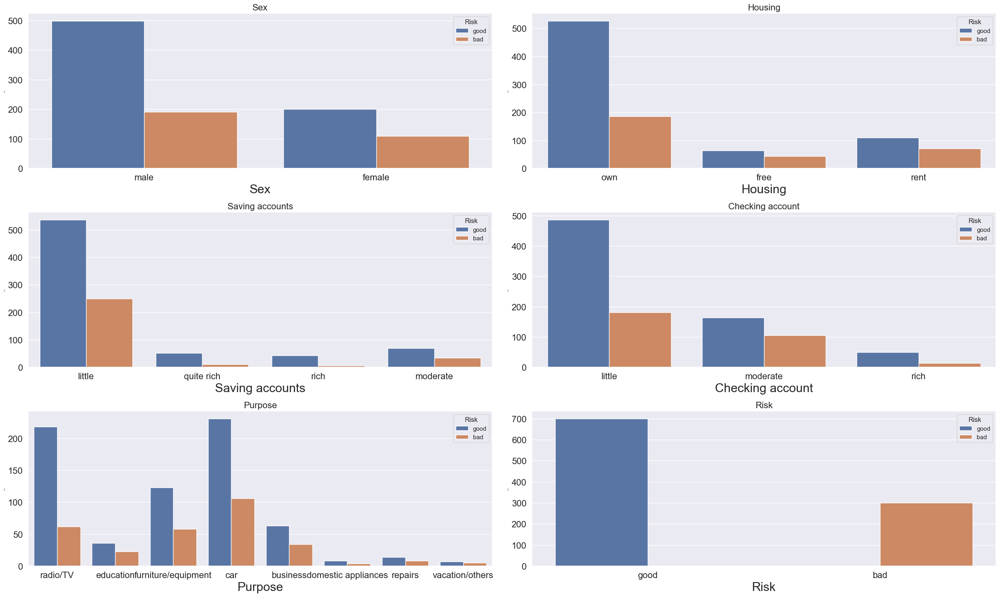

In [173]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(font_scale=1)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(25, 15))

cat_cols = german.select_dtypes(include=['object']).columns

for i, column in enumerate(cat_cols):
    row = i // 2
    col = i % 2
    sns.countplot(data=german, x=column, ax=axes[row, col], hue="Risk")
    axes[row, col].set_title(column, fontsize=16)
    
    # Increase x-tick and y-tick sizes
    axes[row, col].tick_params(axis='x', labelsize=16)
    axes[row, col].tick_params(axis='y', labelsize=16)
    
    # Increase x-axis label size
    axes[row, col].set_xlabel(column, fontsize=22)
    
    # Increase y-axis label size
    axes[row, col].set_ylabel('Count', fontsize=2)

plt.tight_layout()
plt.show()


# Sex vs Risk

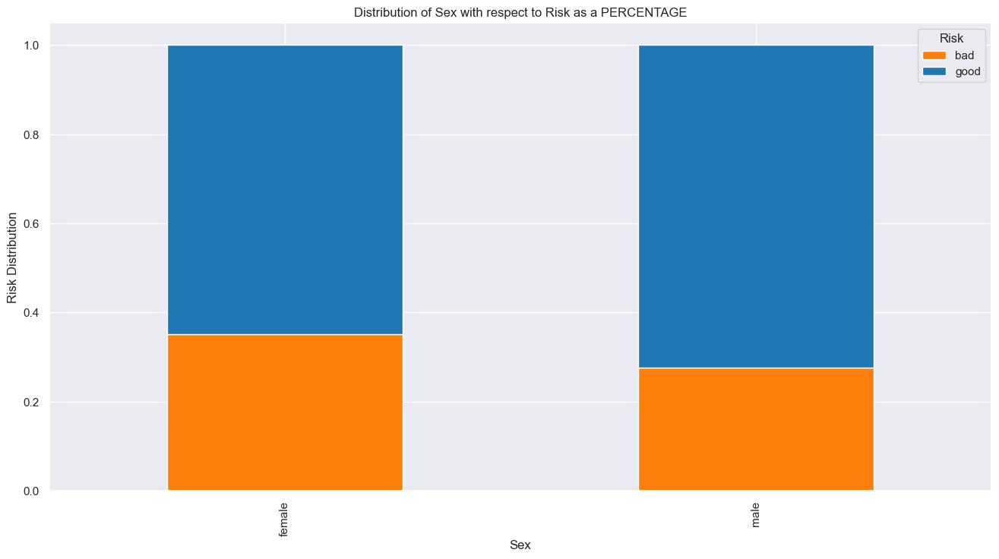

In [175]:
palette = ['tab:orange', 'tab:blue']
grouped_data = german.groupby('Sex')['Risk'].value_counts(normalize=True).unstack()

grouped_data.plot(kind='bar', stacked=True, color=palette)
plt.xlabel('Sex')
plt.ylabel('Risk Distribution')
plt.title('Distribution of Sex with respect to Risk as a PERCENTAGE')
plt.legend(title='Risk')
plt.show()

## Encoding categorical columns

In [30]:
le = LabelEncoder()
class_list = []

for col in german.select_dtypes(include=[object]):
    le.fit(german[col]) 
    print(col)
    print(dict(zip(le.classes_, le.transform(le.classes_))))
    class_list.append(dict(zip(le.classes_, le.transform(le.classes_))))
    german[col] = le.fit_transform(german[col])
    print('-'*50)

Sex
{'female': 0, 'male': 1}
--------------------------------------------------
Housing
{'free': 0, 'own': 1, 'rent': 2}
--------------------------------------------------
Saving accounts
{'little': 0, 'moderate': 1, 'quite rich': 2, 'rich': 3}
--------------------------------------------------
Checking account
{'little': 0, 'moderate': 1, 'rich': 2}
--------------------------------------------------
Purpose
{'business': 0, 'car': 1, 'domestic appliances': 2, 'education': 3, 'furniture/equipment': 4, 'radio/TV': 5, 'repairs': 6, 'vacation/others': 7}
--------------------------------------------------
Risk
{'bad': 0, 'good': 1}
--------------------------------------------------


In [31]:
german.head()

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
0,67,1,2,1,0,0,1169,6,5,1
1,22,0,2,1,0,1,5951,48,5,0
2,49,1,1,1,0,0,2096,12,3,1
3,45,1,2,0,0,0,7882,42,4,1
4,53,1,2,0,0,0,4870,24,1,0


In [32]:
german.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Age               1000 non-null   int64
 1   Sex               1000 non-null   int32
 2   Job               1000 non-null   int64
 3   Housing           1000 non-null   int32
 4   Saving accounts   1000 non-null   int32
 5   Checking account  1000 non-null   int32
 6   Credit amount     1000 non-null   int64
 7   Duration          1000 non-null   int64
 8   Purpose           1000 non-null   int32
 9   Risk              1000 non-null   int32
dtypes: int32(6), int64(4)
memory usage: 94.8 KB


In [33]:
german.describe()

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,35.546000,0.690000,1.904000,1.071000,0.373000,0.395000,3271.258000,20.903000,2.878000,0.700000
std,11.375469,0.462725,0.653614,0.531264,0.805307,0.604434,2822.736876,12.058814,1.978138,0.458487
min,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000,250.000000,4.000000,0.000000,0.000000
25%,27.000000,0.000000,2.000000,1.000000,0.000000,0.000000,1365.500000,12.000000,1.000000,0.000000
50%,33.000000,1.000000,2.000000,1.000000,0.000000,0.000000,2319.500000,18.000000,3.000000,1.000000
75%,42.000000,1.000000,2.000000,1.000000,0.000000,1.000000,3972.250000,24.000000,5.000000,1.000000
max,75.000000,1.000000,3.000000,2.000000,3.000000,2.000000,18424.000000,72.000000,7.000000,1.000000


In [34]:
german.isnull().sum().sort_values(ascending=False)

Age                 0
Sex                 0
Job                 0
Housing             0
Saving accounts     0
Checking account    0
Credit amount       0
Duration            0
Purpose             0
Risk                0
dtype: int64

In [35]:
class_list

[{'female': 0, 'male': 1},
 {'free': 0, 'own': 1, 'rent': 2},
 {'little': 0, 'moderate': 1, 'quite rich': 2, 'rich': 3},
 {'little': 0, 'moderate': 1, 'rich': 2},
 {'business': 0,
  'car': 1,
  'domestic appliances': 2,
  'education': 3,
  'furniture/equipment': 4,
  'radio/TV': 5,
  'repairs': 6,
  'vacation/others': 7},
 {'bad': 0, 'good': 1}]

### All the distributions together, encoded

In [36]:
#palette = sns.color_palette("tab10", 2)
palette = ['tab:orange', 'tab:blue']

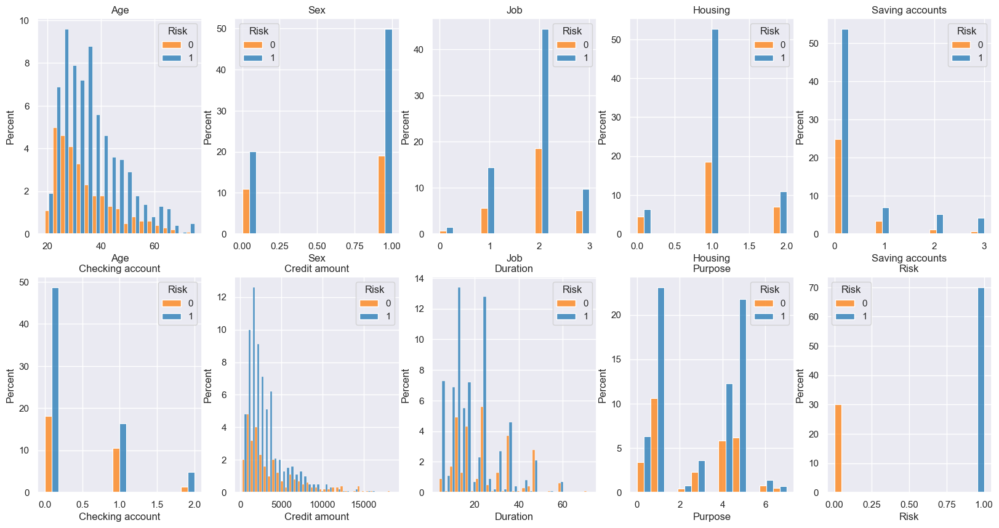

In [37]:
fig, axes = plt.subplots(nrows= 2, ncols = 5, figsize=(20,10))

for i, column in enumerate(german.columns):
    row = i // 5
    col = i % 5 
    sns.histplot(data=german, x=german[column], ax=axes[row, col], hue="Risk", palette = palette, multiple='dodge', stat='percent')
    axes[row, col].set_title(column)


In [38]:
# fig, axes = plt.subplots(nrows= 2, ncols = 5, figsize=(20,10))

# for i, column in enumerate(german.columns):
#     row = i // 5
#     col = i % 5 
#     german[column].plot.hist(ax=axes[row, col])
#     axes[row, col].set_title(column)


## Feature Correlations

#### Pearson's r

<AxesSubplot:>

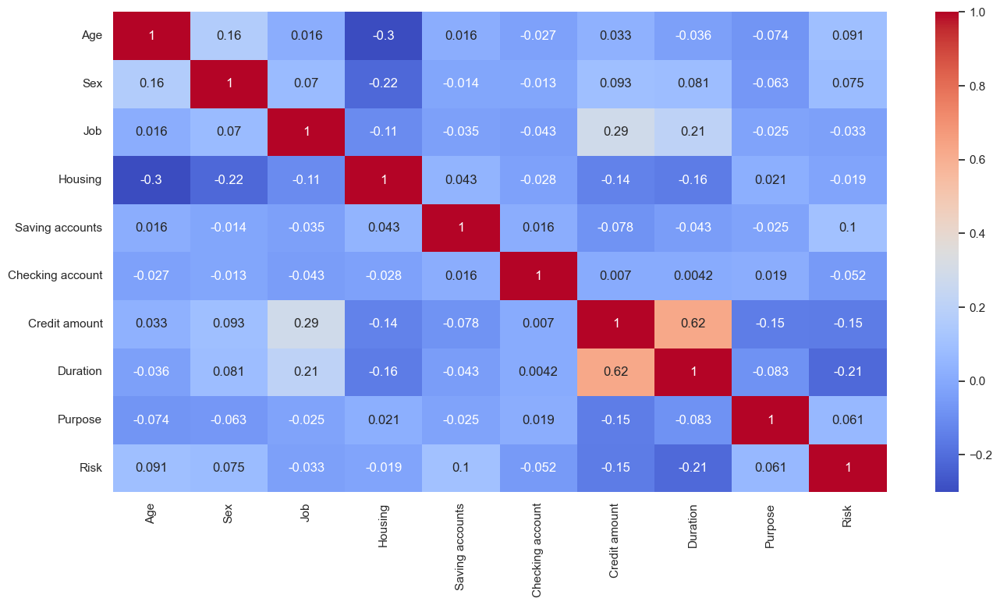

In [39]:
sns.heatmap(german.corr(), annot=True, fmt='.2g', cmap='coolwarm')

#### Spearman r

<AxesSubplot:>

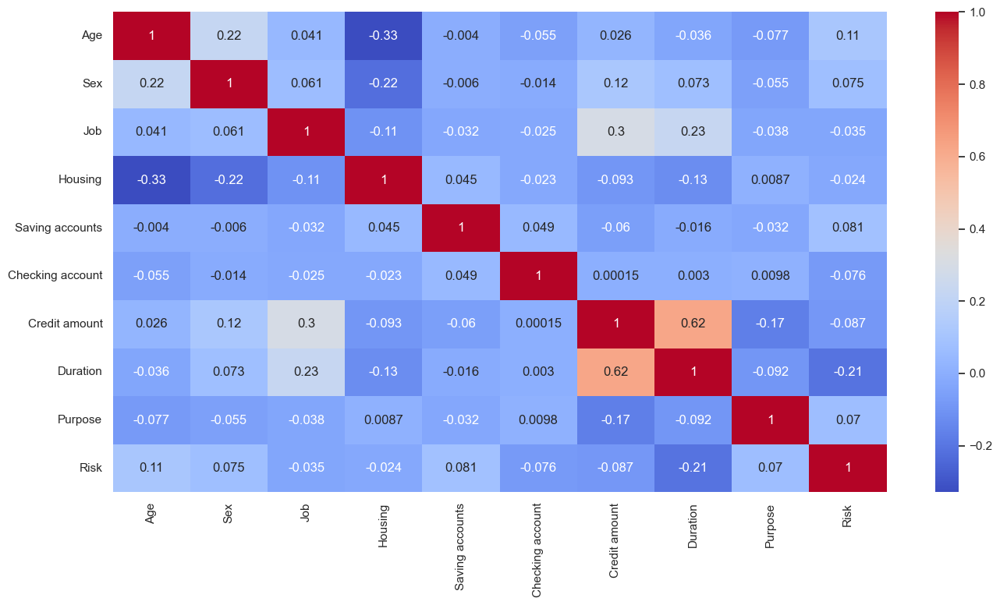

In [40]:
sns.heatmap(german.corr(method='spearman'), annot=True, fmt='.2g', cmap='coolwarm')

## Mutual info classification (non-linear correlations between each feature and target variable)


<BarContainer object of 9 artists>

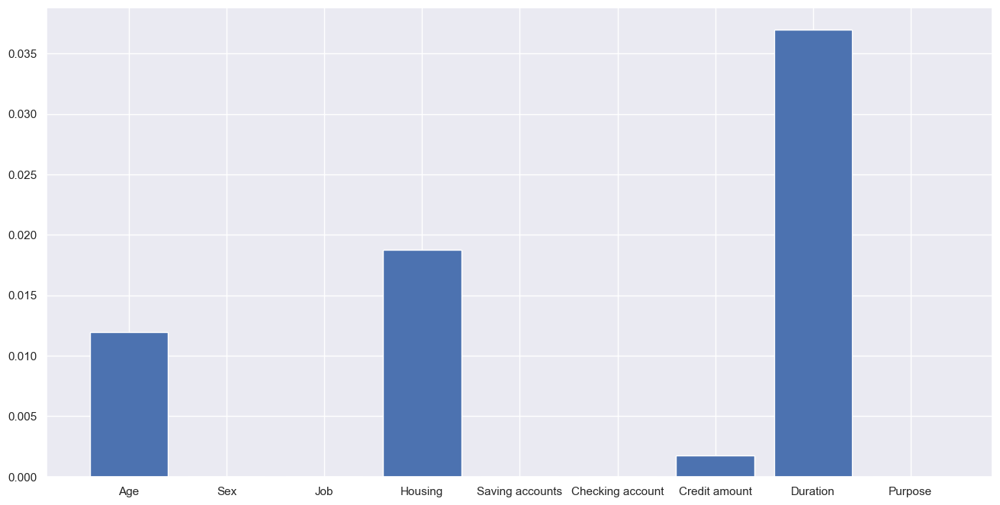

In [41]:
### THIS PRODUCES A DIFFERENT RESULT EACH RUN!!!!!!!!!!!!!!!

mutual_info_X = german.drop('Risk', axis=1)
mutual_info_y = german['Risk']

mutual_info_matrix = mutual_info_classif(mutual_info_X, mutual_info_y)

#sns.countplot(data=mutual_info_matrix, x=mutual_info_X.columns)

plt.bar(mutual_info_X.columns, mutual_info_matrix)

In [42]:
### THIS PRODUCES A DIFFERENT RESULT EACH RUN!!!!!!!!!!!!!!!



mutual_info_X = german.drop('Risk', axis=1)
mutual_info_y = german['Risk']
mutual_info_list = []

for col in mutual_info_X.columns:
    mutual_info_number = mutual_info_classif(mutual_info_X[col].to_numpy().reshape(-1,1), mutual_info_y)
    mutual_info_list.append(mutual_info_number)
    

print(mutual_info_list)    

[array([0]), array([0.01014905]), array([0]), array([0.01285635]), array([0.00994084]), array([0.03080909]), array([0.00989036]), array([0.01815708]), array([0.0016572])]


## Pairplots

Time to complete cell was: 14.607726335525513 seconds


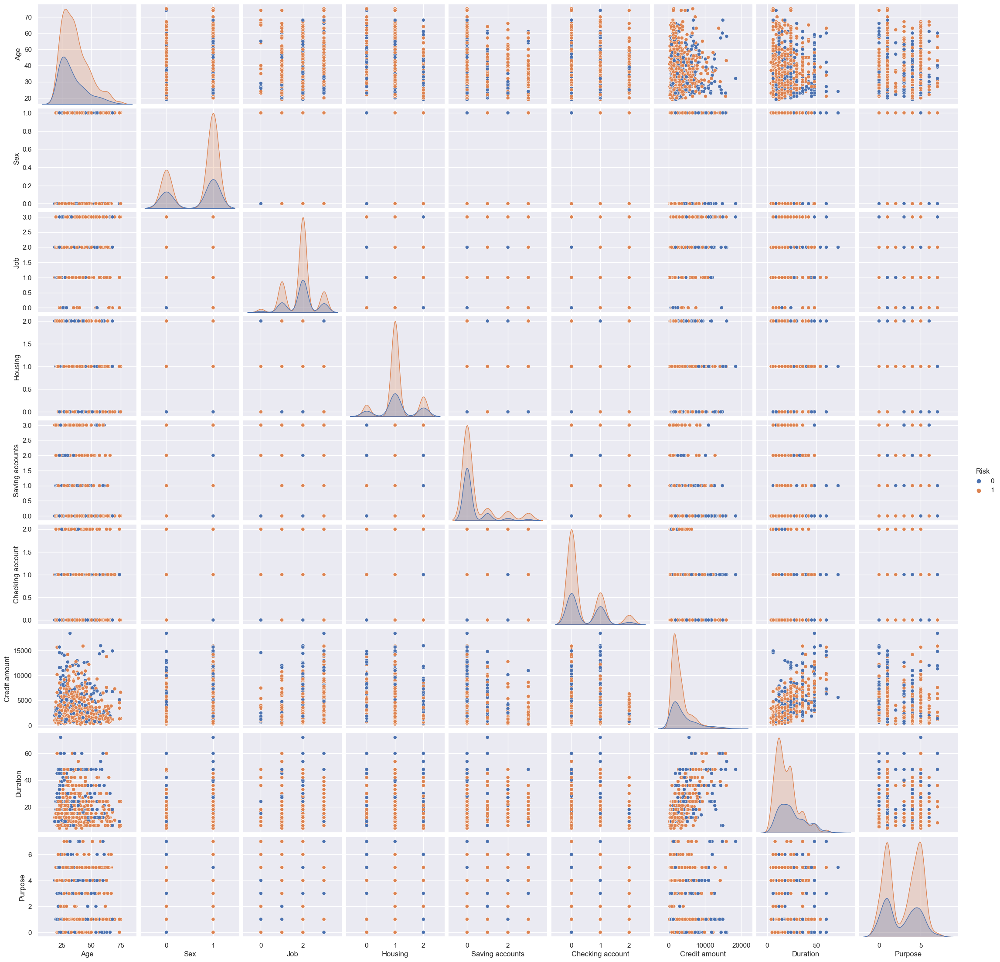

In [43]:
start = time.time()
sns.pairplot(german, kind="scatter", diag_kind="kde", hue="Risk")
end = time.time()

print(f'Time to complete cell was: {end-start} seconds') ### 20 seconds usually

## Male - Female Credit Distribution

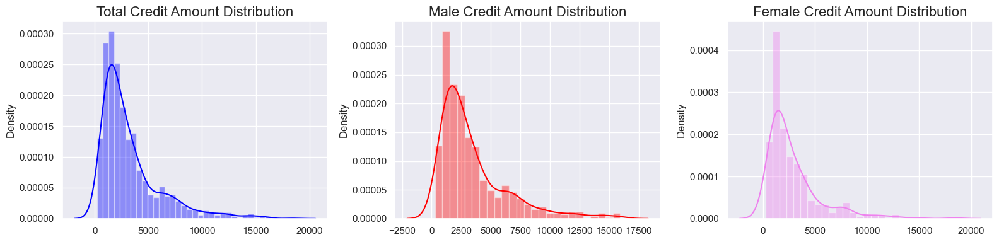

In [44]:
overall = german['Credit amount'].values  # Total credit amounts
male = german[german['Sex'] == 1]['Credit amount'].values # Credit amounts of male
female = german[german['Sex'] == 0]['Credit amount'].values # Credit amounts of female

fig, ax = plt.subplots(1, 3, figsize=(16,4)) # Define subplots - 1 row 3 column
sns.distplot(overall, ax=ax[0], color= 'blue')
ax[0].set_title("Total Credit Amount Distribution", fontsize=16) # Distribution plot of total credit amounts
sns.distplot(male, ax=ax[1], color="red") # Distribution plot of male credit amounts
ax[1].set_title("Male Credit Amount Distribution", fontsize=16)
sns.distplot(female, ax=ax[2], color="violet") # Distribution plot of female credit amounts
ax[2].set_title("Female Credit Amount Distribution", fontsize=16)
fig.tight_layout()
plt.show()

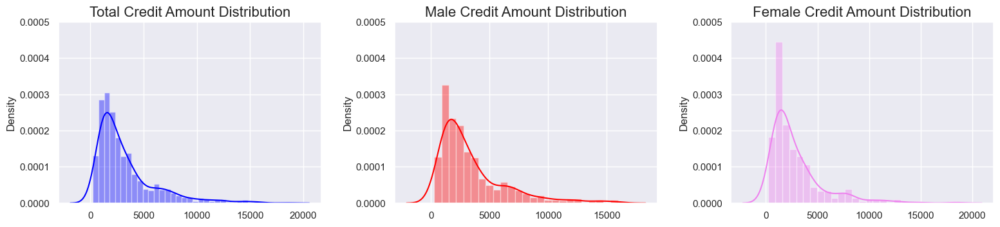

In [45]:
overall = german['Credit amount'].values  # Total credit amounts
male = german[german['Sex'] == 1]['Credit amount'].values # Credit amounts of male
female = german[german['Sex'] == 0]['Credit amount'].values # Credit amounts of female

## we can pick the highest value and uniform all distributions to have an equal y 
ref_y_value = 0.0005
fig, ax = plt.subplots(1, 3, figsize=(16,4)) # Define subplots - 1 row 3 column
sns.distplot(overall, ax=ax[0], color= 'blue')
ax[0].set_title("Total Credit Amount Distribution", fontsize=16) # Distribution plot of total credit amounts
ax[0].set_ylim(0, ref_y_value)
sns.distplot(male, ax=ax[1], color="red") # Distribution plot of male credit amounts
ax[1].set_title("Male Credit Amount Distribution", fontsize=16)
ax[1].set_ylim(0, ref_y_value)
sns.distplot(female, ax=ax[2], color="violet") # Distribution plot of female credit amounts
ax[2].set_title("Female Credit Amount Distribution", fontsize=16)
ax[2].set_ylim(0, ref_y_value)
fig.tight_layout(pad=2.0)
plt.show()

## Housing - Credit amount Distribution

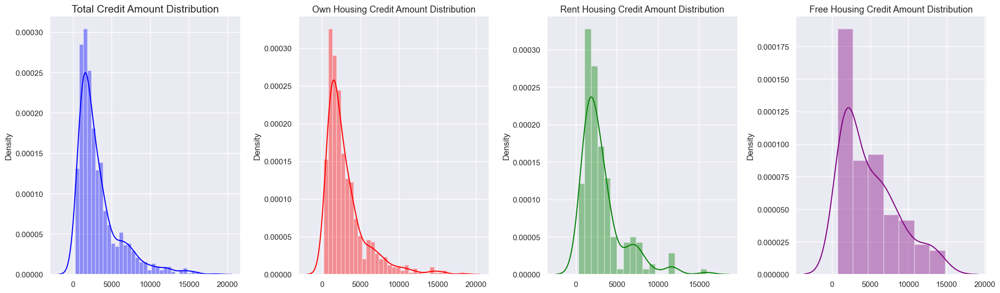

In [46]:
overall = german['Credit amount'].values  # Total credit amounts
own = german[german['Housing'] == 1]['Credit amount'].values # Credit amounts of own housing
rent = german[german['Housing'] == 2]['Credit amount'].values # Credit amounts of rent housing
free = german[german['Housing'] == 0]['Credit amount'].values # Credit amounts of free housing

fig, ax = plt.subplots(1, 4, figsize=(20,6)) # Define subplots - 1 row 4 column
sns.distplot(overall, ax=ax[0], color= 'blue')     # Distribution plot of total credit amounts
ax[0].set_title("Total Credit Amount Distribution", fontsize=15) 
sns.distplot(own, ax=ax[1], color="red") # Distribution plot of own housing credit amounts
ax[1].set_title("Own Housing Credit Amount Distribution", fontsize=13)
sns.distplot(rent, ax=ax[2], color="green") # Distribution plot of rent housing credit amounts
ax[2].set_title("Rent Housing Credit Amount Distribution", fontsize=13)
sns.distplot(free, ax=ax[3], color="purple") # Distribution plot of free housing credit amounts
ax[3].set_title("Free Housing Credit Amount Distribution", fontsize=13)
fig.tight_layout()
plt.show()

## Saving account - Credit amount distribution

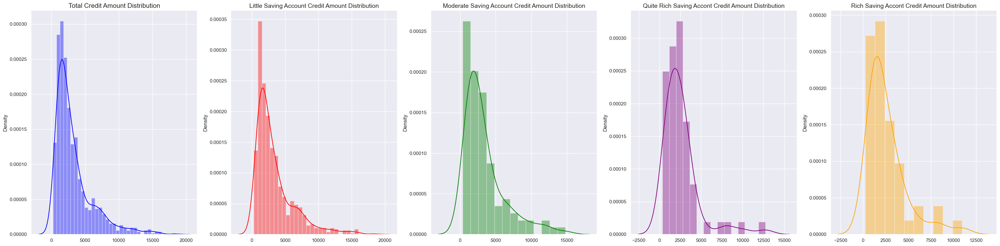

In [47]:
overall = german['Credit amount'].values  # Total credit amounts
little = german[german['Saving accounts'] == 0]['Credit amount'].values # Credit amounts of little saving account
moderate = german[german['Saving accounts'] == 1]['Credit amount'].values # Credit amounts of moderate saving account
qrich = german[german['Saving accounts'] == 2]['Credit amount'].values # Credit amounts of quite rich saving account
rich = german[german['Saving accounts'] == 3]['Credit amount'].values # Credit amounts of rich saving account

fig, ax = plt.subplots(1, 5, figsize=(32,8)) # Define subplots - 1 row 5 column
sns.distplot(overall, ax=ax[0], color= 'blue')   # Distribution plot of total credit amounts
ax[0].set_title("Total Credit Amount Distribution", fontsize=15) 
sns.distplot(little, ax=ax[1], color="red") # Distribution plot of little savings credit amounts
ax[1].set_title("Little Saving Account Credit Amount Distribution", fontsize=14)
sns.distplot(moderate, ax=ax[2], color="green") # Distribution plot of moderate savings credit amounts
ax[2].set_title("Moderate Saving Account Credit Amount Distribution", fontsize=14)
sns.distplot(qrich, ax=ax[3], color="purple") # Distribution plot of quite rich savings credit amounts
ax[3].set_title("Quite Rich Saving Accont Credit Amount Distribution", fontsize=14)
sns.distplot(rich, ax=ax[4], color="orange") # Distribution plot of rich credit amounts
ax[4].set_title("Rich Saving Accont Credit Amount Distribution", fontsize=14)
fig.tight_layout()
plt.show()

## Checking account - Credit amount distribution

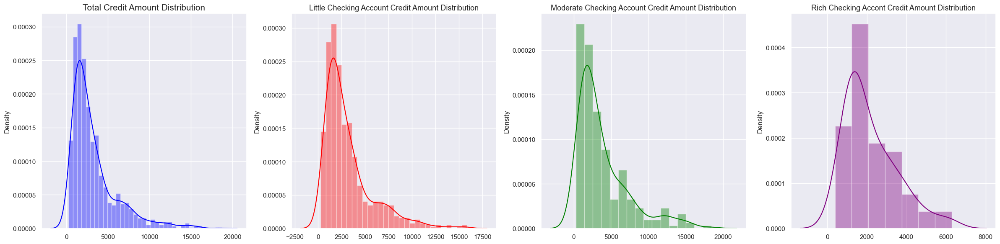

In [48]:
overall = german['Credit amount'].values  # Total credit amounts
little = german[german['Checking account'] == 0]['Credit amount'].values # Credit amounts of little checking account
moderate = german[german['Checking account'] == 1]['Credit amount'].values # Credit amounts of moderate checking account
rich = german[german['Checking account'] == 2]['Credit amount'].values # Credit amounts of rich checking account

fig, ax = plt.subplots(1, 4, figsize=(24,6)) # Define subplots - 1 row 4 column
sns.distplot(overall, ax=ax[0], color= 'blue')   # Distribution plot of total credit amounts
ax[0].set_title("Total Credit Amount Distribution", fontsize=15) 
sns.distplot(little, ax=ax[1], color="red") # Distribution plot of little checking credit amounts
ax[1].set_title("Little Checking Account Credit Amount Distribution", fontsize=13)
sns.distplot(moderate, ax=ax[2], color="green") # Distribution plot of moderate checking credit amounts
ax[2].set_title("Moderate Checking Account Credit Amount Distribution", fontsize=13)
sns.distplot(rich, ax=ax[3], color="purple") # Distribution plot of rich checking credit amounts
ax[3].set_title("Rich Checking Accont Credit Amount Distribution", fontsize=13)
fig.tight_layout()
plt.show()

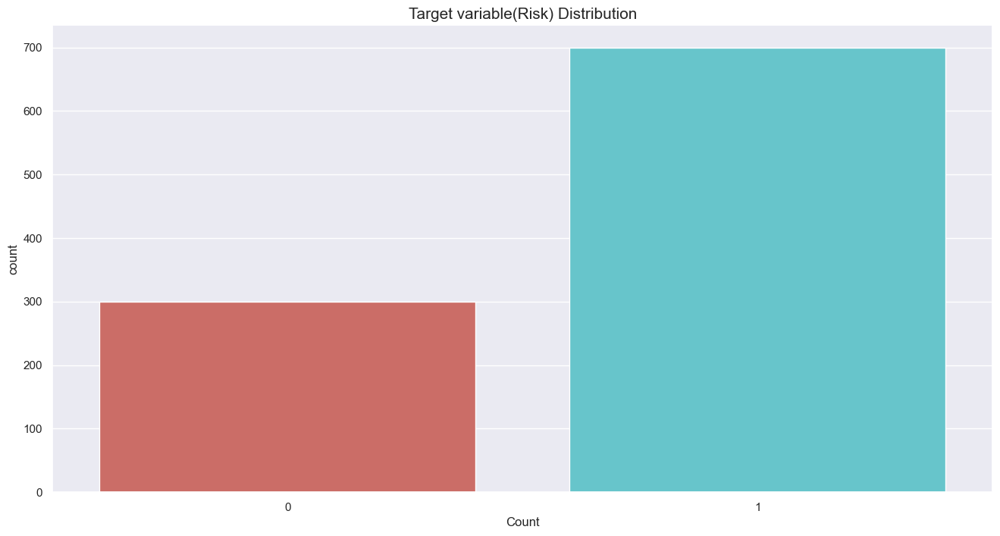

In [49]:
g1 = sns.countplot(x="Risk",data= german, palette="hls")                  
g1.set_title("Target variable(Risk) Distribution", fontsize=15)
g1.set_xlabel("Risk")
g1.set_xlabel("Count")
plt.show()

## Age - Risk Distribution

In [50]:
df_good = german.loc[german["Risk"] == 1]['Age'].values.tolist() # Age of people with good credit risk
df_bad = german.loc[german["Risk"] == 0]['Age'].values.tolist()   # Age of people with bad credit risk
df_age = german['Age'].values.tolist()

# Age distribution of people with good credit risk
trace0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Good Credit"
)
# Age distribution of people with good credit risk
trace1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Bad Credit"
)
# Age distribution of people in the dataset
trace2 = go.Histogram(
    x=df_age,
    histnorm='probability',
    name="Overall Age"
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Good Credit','Bad Credit', 'Overall Age Distribuition'))

#Setting the figs
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig.append_trace(trace2, 2, 1)

fig['layout'].update(showlegend=True, title='Age Distribution', bargap=0.05)
#py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')
fig.show()

In [51]:
german.head()

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
0,67,1,2,1,0,0,1169,6,5,1
1,22,0,2,1,0,1,5951,48,5,0
2,49,1,1,1,0,0,2096,12,3,1
3,45,1,2,0,0,0,7882,42,4,1
4,53,1,2,0,0,0,4870,24,1,0


# Fitting the models

In [52]:
X = german.drop('Risk', axis=1)
y = german['Risk']

In [53]:
X.head()

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose
0,67,1,2,1,0,0,1169,6,5
1,22,0,2,1,0,1,5951,48,5
2,49,1,1,1,0,0,2096,12,3
3,45,1,2,0,0,0,7882,42,4
4,53,1,2,0,0,0,4870,24,1


In [54]:
y.head()

0    1
1    0
2    1
3    1
4    0
Name: Risk, dtype: int32

In [55]:
class1_percent = (y.sum() / y.shape[0]) # imbalance 70% good risk, 30% bad risk
class0_percent = 1 - class1_percent
print('The percentage of class 1 (Good Risk) is {:.2%} while the percentage of class 0 (Bad Risk) is {:.2%}%'.format(class1_percent, class0_percent))

The percentage of class 1 (Good Risk) is 70.00% while the percentage of class 0 (Bad Risk) is 30.00%%


In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(800, 9)
(800,)
(200, 9)
(200,)


In [57]:
ros = RandomOverSampler(random_state=42)

X_train_res, y_train_res = ros.fit_resample(X_train, y_train)


print(X_train_res.shape)
print(y_train_res.shape)
print(X_test.shape)
print(y_test.shape)

(1120, 9)
(1120,)
(200, 9)
(200,)


In [58]:
def german_classifier(classifier, X_train, y_train, X_test, y_test):
    
    print(f'\n\033[1mPRINTING RESULTS FOR CLASSIFIER: {classifier}:\033[0m\n\n')
    
    clf = classifier

    clf.fit(X_train, y_train)

    preds = clf.predict(X_test)

    print(classification_report(y_test, preds))

    print(f'The F0.5 score is:{fbeta_score(y_test, preds, beta=0.5)}\n')
    print(f'The F2 score is:{fbeta_score(y_test, preds, beta=2.0)}\n')
    print(f'The ROC AUC score is: {roc_auc_score(y_test, preds)}\n')
    print('-'*100)



In [59]:
def german_classifier_cross_val(classifier, X, y):
       
    print(f'\n\033[1mPRINTING RESULTS FOR CLASSIFIER: {classifier}:\033[0m\n\n')

    clf = classifier
    
    cv_scores = cross_val_score(clf, X, y, cv=10, scoring='roc_auc')
    cvy_pred = cross_val_predict(clf, X, y, cv=10)
    print(f'The max cross validation score is: {max(cv_scores)}\n')
    #conf_mat = confusion_matrix(y, cvy_pred)
    #print(conf_mat)
    #sns.heatmap(conf_mat, annot=True, fmt='g', cmap='viridis')

    #plt.show()

    
    



    print(classification_report(y, cvy_pred))

    print(f'The F0.5 score is:{fbeta_score(y, cvy_pred, beta=0.5)}\n')
    print(f'The F2 score is:{fbeta_score(y, cvy_pred, beta=2.0)}\n')
    print(f'The ROC AUC score is: {roc_auc_score(y, cvy_pred)}\n')

    print('-'*100)    
    
    









# Random Forest

### Raw data

In [60]:
german_classifier(RandomForestClassifier(random_state=42), X_train, y_train, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.57      0.28      0.38        60
           1       0.75      0.91      0.82       140

    accuracy                           0.72       200
   macro avg       0.66      0.60      0.60       200
weighted avg       0.69      0.72      0.69       200

The F0.5 score is:0.7743902439024389

The F2 score is:0.8698630136986302

The ROC AUC score is: 0.5952380952380951

----------------------------------------------------------------------------------------------------


### Resampled training data

In [61]:
german_classifier(RandomForestClassifier(random_state=42), X_train_res, y_train_res, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.47      0.38      0.42        60
           1       0.75      0.81      0.78       140

    accuracy                           0.69       200
   macro avg       0.61      0.60      0.60       200
weighted avg       0.67      0.69      0.68       200

The F0.5 score is:0.7661290322580645

The F2 score is:0.80168776371308

The ROC AUC score is: 0.5988095238095238

----------------------------------------------------------------------------------------------------


### Cross validation

In [62]:
german_classifier_cross_val(RandomForestClassifier(random_state=42), X, y)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


The max cross validation score is: 0.7978571428571428

              precision    recall  f1-score   support

           0       0.52      0.27      0.36       300
           1       0.74      0.89      0.81       700

    accuracy                           0.71      1000
   macro avg       0.63      0.58      0.58      1000
weighted avg       0.68      0.71      0.67      1000

The F0.5 score is:0.7674361493123774

The F2 score is:0.8578094976667583

The ROC AUC score is: 0.5830952380952381

----------------------------------------------------------------------------------------------------


### Grid SearchCV for Random Forest

### Train validation test pipeline for Random Forest

In [63]:
kf = StratifiedKFold(n_splits=10, shuffle=False)

In [64]:
rf = RandomForestClassifier(random_state=42)
cross_val_score(rf, X_train, y_train, cv=kf, scoring='roc_auc')

array([0.57552083, 0.76860119, 0.58333333, 0.5688244 , 0.68043155,
       0.7328869 , 0.65922619, 0.59933036, 0.66517857, 0.6499256 ])

In [65]:
params = {
    'n_estimators': [50, 75, 100, 150, 200],
    'max_depth': [4, 6, 10, 12, 15],
    'random_state': [42]
}

grid_no_up = GridSearchCV(rf, param_grid=params, cv=kf, 
                          scoring='roc_auc').fit(X_train, y_train)

grid_no_up.best_score_

0.6812499999999999

In [66]:
grid_no_up.best_estimator_

RandomForestClassifier(max_depth=10, n_estimators=200, random_state=42)

In [67]:
roc_auc_score(y_test, grid_no_up.predict(X_test))

0.6095238095238096

In [68]:
from imblearn.pipeline import Pipeline, make_pipeline

In [69]:
imba_pipeline = make_pipeline(RandomOverSampler(random_state=42), 
                              RandomForestClassifier(n_estimators=150, random_state=42))
cross_val_score(imba_pipeline, X_train, y_train, scoring='roc_auc', cv=kf)

array([0.55877976, 0.74330357, 0.60342262, 0.59561012, 0.66592262,
       0.72879464, 0.6781994 , 0.60974702, 0.63653274, 0.63616071])

In [70]:
new_params = {'randomforestclassifier__' + key: params[key] for key in params}
grid_imba = GridSearchCV(imba_pipeline, param_grid=new_params, cv=kf, scoring='roc_auc',
                        return_train_score=True)
grid_imba.fit(X_train, y_train);

In [71]:
grid_imba.best_params_

{'randomforestclassifier__max_depth': 6,
 'randomforestclassifier__n_estimators': 150,
 'randomforestclassifier__random_state': 42}

In [72]:
grid_imba.best_score_ ### validation roc auc score

0.6694196428571428

In [73]:
y_test_predict = grid_imba.predict(X_test)
roc_auc_score(y_test, y_test_predict) ### test roc auc score

0.6416666666666666

In [74]:
y_test_predict = grid_imba.best_estimator_.named_steps['randomforestclassifier'].predict(X_test)
roc_auc_score(y_test, y_test_predict)

0.6416666666666666

In [75]:
grid_imba.best_estimator_.named_steps['randomforestclassifier']

RandomForestClassifier(max_depth=6, n_estimators=150, random_state=42)

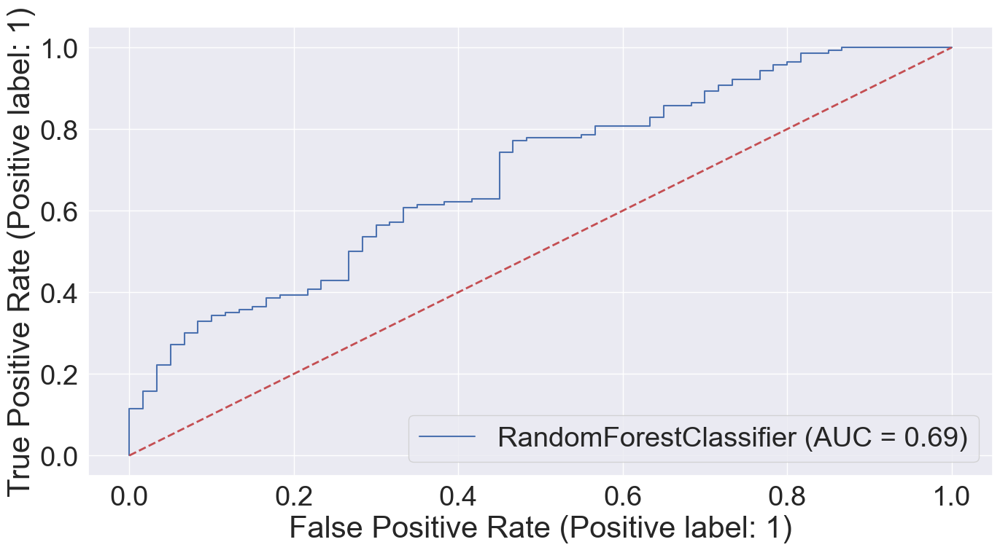

In [139]:
RocCurveDisplay.from_estimator(grid_imba.best_estimator_.named_steps['randomforestclassifier'], X_test, y_test)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random guess')
plt.show()

In [77]:
print(fbeta_score(y_test, y_test_predict, beta=0.5))
print(fbeta_score(y_test, y_test_predict, beta=2))

0.78125
0.7575757575757576


In [78]:
t = RandomForestClassifier(max_depth=6, n_estimators=200, random_state=42)

t.fit(X_train_res, y_train_res)

pr = t.predict(X_test)

print(roc_auc_score(y_test, pr))

0.638095238095238


# Logistic Regression

### Raw data

In [79]:
german_classifier(LogisticRegression(random_state=42), X_train, y_train, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


              precision    recall  f1-score   support

           0       0.35      0.10      0.16        60
           1       0.70      0.92      0.80       140

    accuracy                           0.68       200
   macro avg       0.53      0.51      0.48       200
weighted avg       0.60      0.68      0.61       200

The F0.5 score is:0.7396788990825689

The F2 score is:0.8681022880215343

The ROC AUC score is: 0.5107142857142857

----------------------------------------------------------------------------------------------------


In [80]:
class_weight = {0:2, 1:1}
german_classifier(LogisticRegression(random_state=42, class_weight=class_weight), X_train, y_train, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(class_weight={0: 2, 1: 1}, random_state=42):


              precision    recall  f1-score   support

           0       0.45      0.53      0.49        60
           1       0.78      0.72      0.75       140

    accuracy                           0.67       200
   macro avg       0.62      0.63      0.62       200
weighted avg       0.68      0.67      0.67       200

The F0.5 score is:0.7698170731707317

The F2 score is:0.7329462989840348

The ROC AUC score is: 0.6273809523809524

----------------------------------------------------------------------------------------------------


### Resampled training data

In [81]:
german_classifier(LogisticRegression(random_state=42), X_train_res, y_train_res, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


              precision    recall  f1-score   support

           0       0.43      0.60      0.50        60
           1       0.79      0.66      0.72       140

    accuracy                           0.65       200
   macro avg       0.61      0.63      0.61       200
weighted avg       0.69      0.65      0.66       200

The F0.5 score is:0.7648026315789472

The F2 score is:0.6868537666174298

The ROC AUC score is: 0.6321428571428571

----------------------------------------------------------------------------------------------------


In [82]:
### There is no point to both do oversample and class weights for LR, you need to do only 1!!!

class_weight = {0:1, 1:1}
german_classifier(LogisticRegression(random_state=42, class_weight=class_weight), X_train_res, y_train_res, X_test, y_test) 


PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(class_weight={0: 1, 1: 1}, random_state=42):


              precision    recall  f1-score   support

           0       0.43      0.60      0.50        60
           1       0.79      0.66      0.72       140

    accuracy                           0.65       200
   macro avg       0.61      0.63      0.61       200
weighted avg       0.69      0.65      0.66       200

The F0.5 score is:0.7648026315789472

The F2 score is:0.6868537666174298

The ROC AUC score is: 0.6321428571428571

----------------------------------------------------------------------------------------------------


### Cross validation

In [83]:
german_classifier_cross_val(LogisticRegression(random_state=42), X, y)


PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


The max cross validation score is: 0.7676190476190478

              precision    recall  f1-score   support

           0       0.57      0.14      0.23       300
           1       0.72      0.95      0.82       700

    accuracy                           0.71      1000
   macro avg       0.64      0.55      0.53      1000
weighted avg       0.68      0.71      0.64      1000

The F0.5 score is:0.7586442220200181

The F2 score is:0.8955424274973146

The ROC AUC score is: 0.5480952380952381

----------------------------------------------------------------------------------------------------


### GridSearchCV for LogisticRegression

In [84]:
weight_list = []
weights = np.arange(1.0, 2.45, 0.05)
for w in weights:
    z = {0:w, 1:1}
    weight_list.append(z)
    
#print(weight_list)    
    

In [85]:
best_roc_auc = 0.4
best_wei = 1
weights = np.arange(0.3, 2, 0.02)

for w in weights:   
    wei = {0:w, 1:1}
    lr = LogisticRegression(random_state=42, solver = 'liblinear', class_weight = wei)
    lr.fit(X_train_res, y_train_res)

    pre = lr.predict(X_test)

    #print(classification_report(y_test, pre))

    #print(roc_auc_score(y_test, pre))
    if roc_auc_score(y_test, pre) > best_roc_auc:
        best_roc_auc = roc_auc_score(y_test, pre)
        best_wei = w
        
        
print(best_wei)
print(best_roc_auc)

1.1200000000000008
0.6583333333333333


In [86]:

wei = {0:best_wei, 1:1}
lr = LogisticRegression(random_state=42, solver = 'liblinear', class_weight = wei)
lr.fit(X_train_res, y_train_res)

pre = lr.predict(X_test)

print(classification_report(y_test, pre))

print(f'The roc auc score is: {roc_auc_score(y_test, pre)}')

print(fbeta_score(y_test, pre, beta=0.5))

print(fbeta_score(y_test, pre, beta=2))


              precision    recall  f1-score   support

           0       0.43      0.72      0.54        60
           1       0.83      0.60      0.70       140

    accuracy                           0.64       200
   macro avg       0.63      0.66      0.62       200
weighted avg       0.71      0.64      0.65       200

The roc auc score is: 0.6583333333333333
0.7720588235294118
0.6354009077155824


In [87]:
start = time.time()

params = {'penalty': ['l2'],
         'class_weight': weight_list}

lr_cv = LogisticRegression(random_state=42, solver = 'liblinear')
gcv_lr = GridSearchCV(estimator=lr_cv, param_grid=params, error_score=0.0)
gcv_lr.fit(X_train_res, y_train_res)

end = time.time()

print(f'The time to run the Grid Search for Logistic Regression was: {end-start} seconds')

The time to run the Grid Search for Logistic Regression was: 1.2838530540466309 seconds


In [88]:
gcv_lr.best_estimator_

LogisticRegression(class_weight={0: 1.0, 1: 1}, random_state=42,
                   solver='liblinear')

In [89]:
lr_best_grid = gcv_lr.best_estimator_

lr_best_grid.fit(X_train_res, y_train_res)

preds_lr_best_grid = lr_best_grid.predict(X_test)

print(classification_report(y_test, preds_lr_best_grid))

print(f'The ROC AUC score is: {roc_auc_score(y_test, preds_lr_best_grid)}\n')

              precision    recall  f1-score   support

           0       0.43      0.58      0.49        60
           1       0.79      0.66      0.72       140

    accuracy                           0.64       200
   macro avg       0.61      0.62      0.61       200
weighted avg       0.68      0.64      0.65       200

The ROC AUC score is: 0.6238095238095237



In [90]:
lr_best_grid.coef_[0]

array([ 2.07933852e-02,  3.93320208e-01,  1.23273659e-01, -1.00461566e-01,
        3.54200290e-01, -2.87935964e-01,  3.16265880e-05, -4.28757668e-02,
        6.36145934e-02])

In [91]:
features = pd.DataFrame(lr_best_grid.coef_[0], X.columns, columns=['coefficient'])
features

,coefficient
Age,0.020793
Sex,0.393320
Job,0.123274
Housing,-0.100462
Saving accounts,0.354200
Checking account,-0.287936
Credit amount,0.000032
Duration,-0.042876
Purpose,0.063615


In [92]:
# However, some of the features are on the different scale. We have to fix it to safely compare coefficients of features and get insight about their relative importance
stdevs = []
stdevs = []
for i in X.columns:
    stdev = german[i].std()
    stdevs.append(stdev)
features["stdev"] = np.array(stdevs).reshape(-1,1)
features["importance"] = features["coefficient"] * features["stdev"]

In [93]:
features

,coefficient,stdev,importance
Age,0.020793,11.375469,0.236534
Sex,0.393320,0.462725,0.181999
Job,0.123274,0.653614,0.080573
Housing,-0.100462,0.531264,-0.053372
Saving accounts,0.354200,0.805307,0.285240
Checking account,-0.287936,0.604434,-0.174038
Credit amount,0.000032,2822.736876,0.089274
Duration,-0.042876,12.058814,-0.517031
Purpose,0.063615,1.978138,0.125838


In [94]:
# Normalize the importance columns to make the comparison more understandable
features['importance_normalized'] = 100*features['importance'] / features['importance'].abs().max()

In [95]:
features

,coefficient,stdev,importance,importance_normalized
Age,0.020793,11.375469,0.236534,45.748618
Sex,0.393320,0.462725,0.181999,35.200789
Job,0.123274,0.653614,0.080573,15.583862
Housing,-0.100462,0.531264,-0.053372,-10.322709
Saving accounts,0.354200,0.805307,0.285240,55.168849
Checking account,-0.287936,0.604434,-0.174038,-33.661093
Credit amount,0.000032,2822.736876,0.089274,17.266576
Duration,-0.042876,12.058814,-0.517031,-100.000000
Purpose,0.063615,1.978138,0.125838,24.338666


In [96]:
sorted_features = features.sort_values(by = ['importance_normalized'])

In [97]:
sorted_features['importance_normalized_abs'] = sorted_features['importance_normalized'].abs()
sorted_features = sorted_features.sort_values(by = ['importance_normalized_abs'])

In [98]:
sorted_features

,coefficient,stdev,importance,importance_normalized,importance_normalized_abs
Housing,-0.100462,0.531264,-0.053372,-10.322709,10.322709
Job,0.123274,0.653614,0.080573,15.583862,15.583862
Credit amount,0.000032,2822.736876,0.089274,17.266576,17.266576
Purpose,0.063615,1.978138,0.125838,24.338666,24.338666
Checking account,-0.287936,0.604434,-0.174038,-33.661093,33.661093
Sex,0.393320,0.462725,0.181999,35.200789,35.200789
Age,0.020793,11.375469,0.236534,45.748618,45.748618
Saving accounts,0.354200,0.805307,0.285240,55.168849,55.168849
Duration,-0.042876,12.058814,-0.517031,-100.000000,100.000000


Text(0.5, 1.0, 'Coefficient Importance for Logistic Regression')

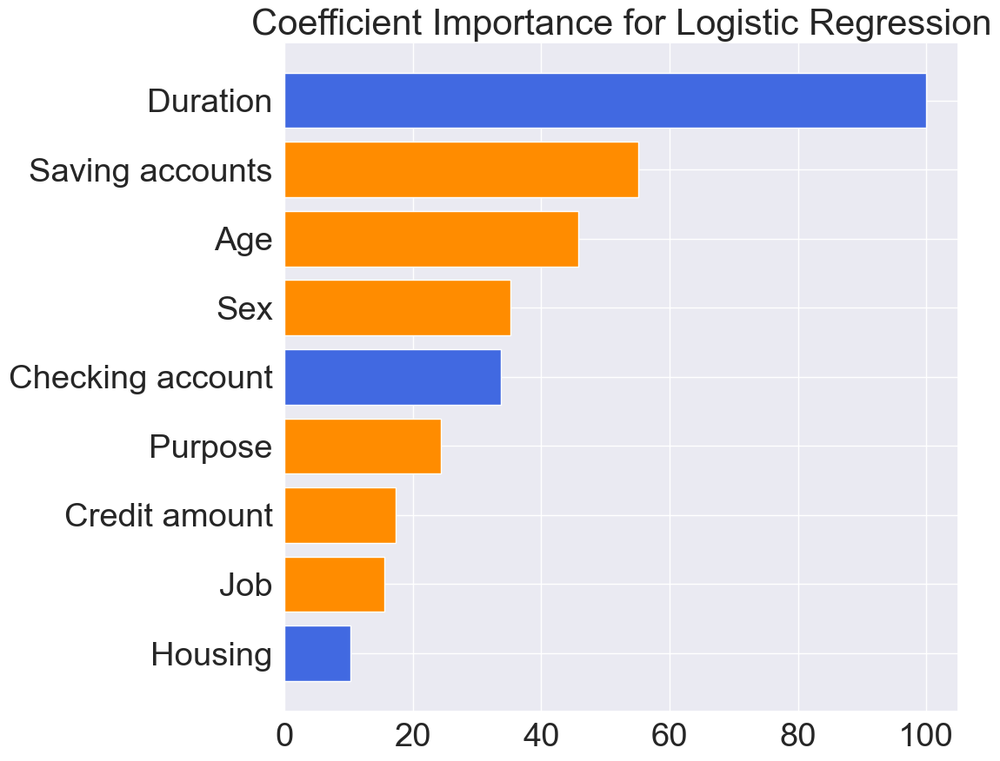

In [137]:
# Show the impact of the features to predict whether the patient has a diabates on the bar graph
plt.figure(figsize=(10, 10))
color = ['royalblue', 'darkorange', 'darkorange', 'darkorange', 'royalblue', 'darkorange', 'darkorange', 'darkorange', 'royalblue']
plt.barh(sorted_features.index, sorted_features.importance_normalized_abs, color=color)
plt.title("Coefficient Importance for Logistic Regression")

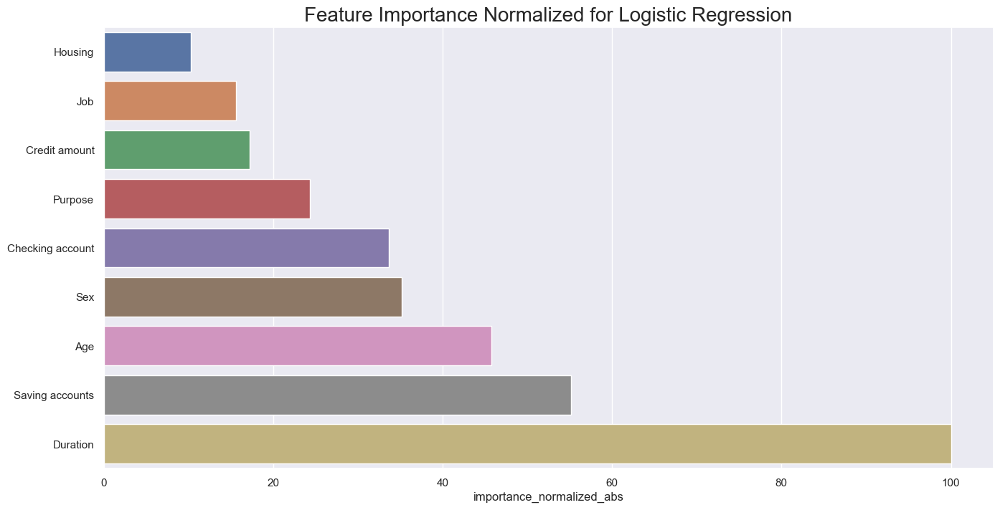

In [100]:
sns.barplot(y=sorted_features.index, x=sorted_features.importance_normalized_abs, orient='h').set_title('Feature Importance Normalized for Logistic Regression',  fontdict= { 'fontsize': 20})
plt.show()

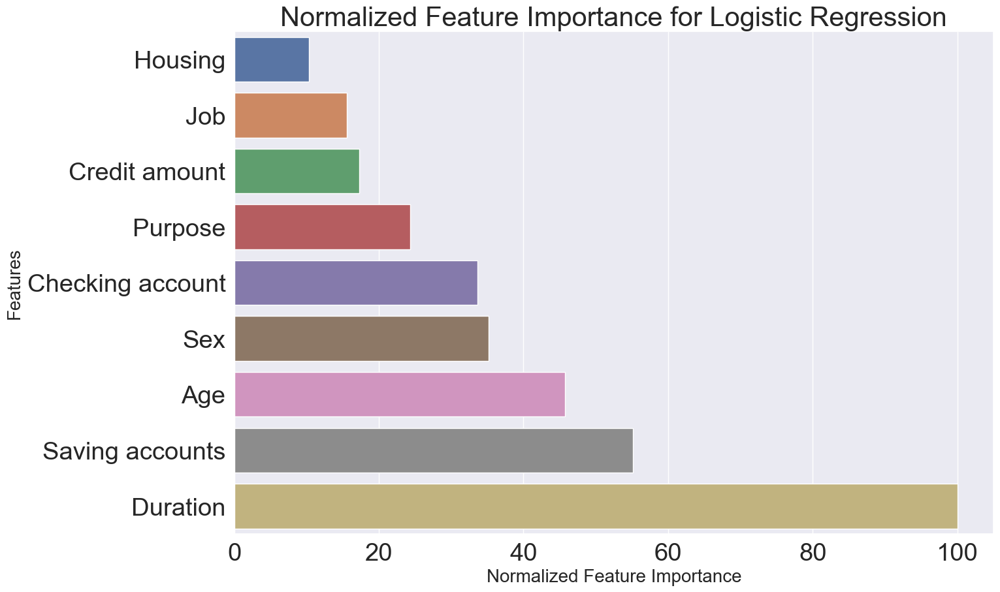

In [101]:
sns.set(font_scale = 2.5)

# Set figure size (width, height) in inches
fig, ax = plt.subplots(figsize = ( 15 , 10 ))
  
# Plot the scatterplot
sns.barplot(y=sorted_features.index, x=sorted_features.importance_normalized_abs, orient='h')
  
# Set label for x-axis
ax.set_xlabel( "Normalized Feature Importance" , size = 20 )
  
# Set label for y-axis
ax.set_ylabel( "Features" , size = 20 )
  
# Set title for plot
ax.set_title( "Normalized Feature Importance for Logistic Regression" , size = 30 )
  
# Display figure
plt.show()

In [102]:
lr_best_grid

LogisticRegression(class_weight={0: 1.0, 1: 1}, random_state=42,
                   solver='liblinear')

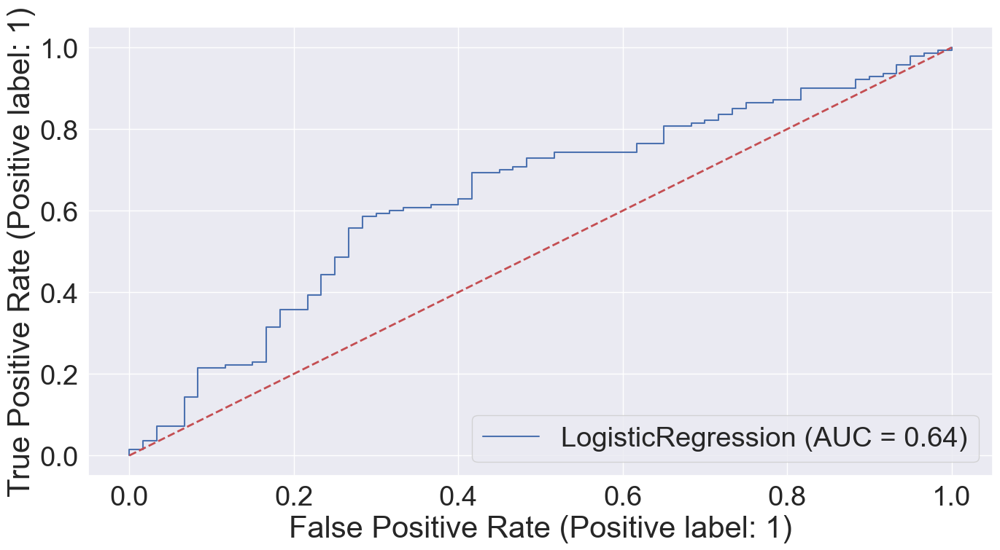

In [103]:
RocCurveDisplay.from_estimator(lr_best_grid, X_test, y_test)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random guess')
plt.show()

In [104]:
lr_best_grid.predict_proba(X_test.iloc[25].to_numpy().reshape(1,-1))

array([[0.69896565, 0.30103435]])

# Function to explain instance

In [105]:
def lime_explainer(classifier, X_train, y_train, X_test, y_test, test_index):
    
    clf = classifier
    
    clf.fit(X_train, y_train)
    preds = clf.predict(X_test)
    
    categorical_features = [1, 2, 3, 4, 5, 8]
    class_names = ['Bad Risk', 'Good Risk']
    explainer_lime = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train),
                                                  feature_names=X_train.columns,
                                                  class_names=class_names,
                                                  categorical_features = categorical_features,
                                                  verbose=True,     
                                                  mode='classification'
                                                      )
    #m = np.arange(X_test.shape[0])
    #test_index = random.choice(m)
    test_index_rf = test_index
    instance_rf = X_test.iloc[test_index_rf]
    print('Model prediction: ', class_names[preds[test_index_rf]])
    print(instance_rf)
    print('')

    # It explains how we come to a particular prediction based on feature contribution as HTML.
    exp_lime = explainer_lime.explain_instance(
        data_row=X_test.iloc[test_index_rf], 
        predict_fn=clf.predict_proba
    )
    print('Model prediction: ', class_names[preds[test_index_rf]])
    print('True label: ', class_names[y_test.iloc[test_index_rf]])
    # check also LIME linear model predictions
    top_labels = exp_lime.available_labels()
    #print(f'Top labels is: {top_labels}')
    #print('')
    print('LIME predicted label: %d (%s)' % (top_labels[0], class_names[top_labels[0]]))
    # TODO: remove the warning message below

    exp_lime.show_in_notebook(show_table=True)
    
    return preds
    

In [106]:
test_index = 7

shap.initjs() 
explainer_shap = shap.TreeExplainer(grid_imba.best_estimator_.named_steps['randomforestclassifier'])
false_preds_rf = np.argwhere((y_test_predict != y_test).to_numpy().flatten())
instance_rf = X_test.iloc[test_index]
instance = instance_rf
shap_values = explainer_shap.shap_values(instance)
print("SHAP values for instance:", shap_values[1].round(5))
print("Sum of SHAP values:", shap_values[1].sum().round(5))
print("Expected value:", explainer_shap.expected_value[1].round(5))
print("Sum of SHAP values and expected value:", (explainer_shap.expected_value[1] + shap_values[1].sum()).round(5))

shap.initjs()  

shap.force_plot(explainer_shap.expected_value[1], shap_values[1], instance)

SHAP values for instance: [ 0.09766  0.00734  0.00484 -0.00737 -0.00419  0.0219   0.04962 -0.01519
  0.03345]
Sum of SHAP values: 0.18807
Expected value: 0.50002
Sum of SHAP values and expected value: 0.68809


# LIME vs LR

In [107]:
preds = lime_explainer(grid_imba.best_estimator_.named_steps['randomforestclassifier'], X_train_res, y_train_res, X_test, y_test, 25)

Model prediction:  Bad Risk
Age                   31
Sex                    1
Job                    2
Housing                0
Saving accounts        0
Checking account       0
Credit amount       6110
Duration              48
Purpose                3
Name: 36, dtype: int64

Intercept 0.5997862179652362
Prediction_local [0.35126233]
Right: 0.39208214099595273
Model prediction:  Bad Risk
True label:  Good Risk
LIME predicted label: 1 (Good Risk)


In [118]:
lr_best_grid.predict_proba(X_test.iloc[25].to_numpy().reshape(1,-1))[0]

array([0.69896565, 0.30103435])

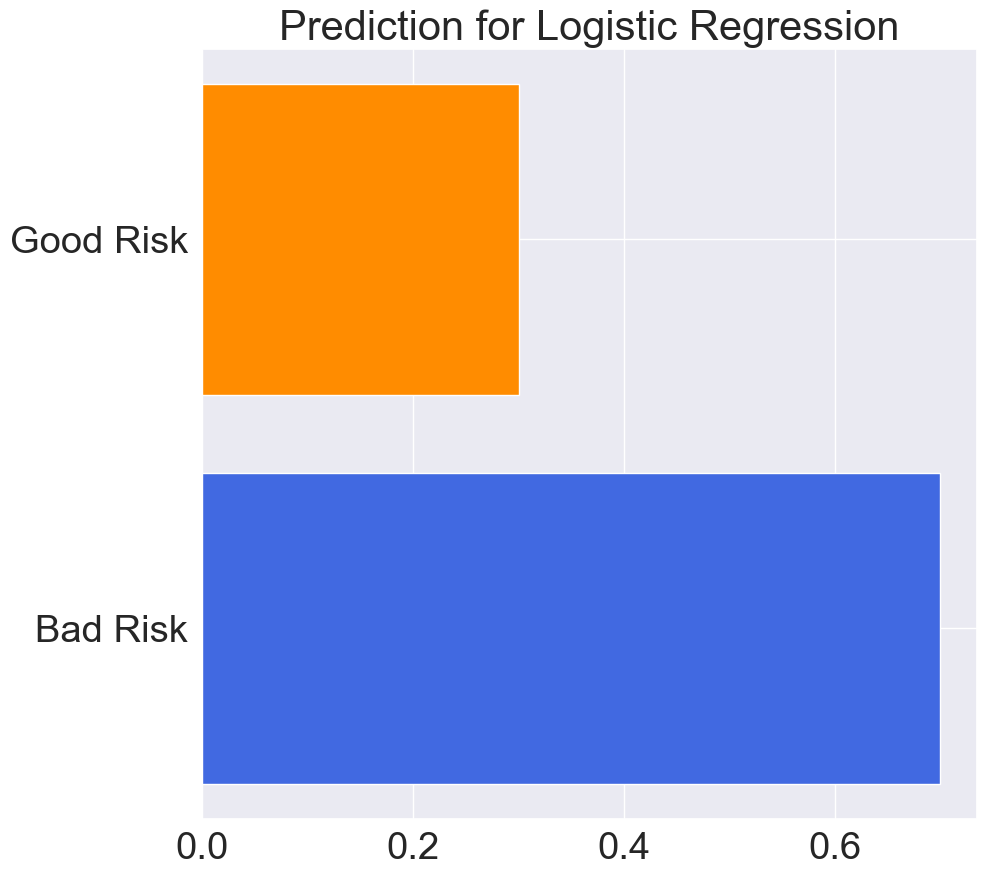

In [136]:
plt.figure(figsize=(10, 10))
color_lr = ['royalblue', 'darkorange']
plt.barh(['Bad Risk', 'Good Risk'], lr_best_grid.predict_proba(X_test.iloc[25].to_numpy().reshape(1,-1))[0], color = color_lr)
plt.title("Prediction for Logistic Regression")
plt.show()

### LIME, Random Forest, no resample, no dropped columns, wrong predictions

In [108]:
test_index = false_preds_rf[2][0]

false_preds = lime_explainer(grid_imba.best_estimator_.named_steps['randomforestclassifier'], X_train_res, y_train_res, X_test, y_test, test_index)

Model prediction:  Good Risk
Age                   65
Sex                    1
Job                    2
Housing                0
Saving accounts        0
Checking account       0
Credit amount       2600
Duration              18
Purpose                5
Name: 624, dtype: int64

Intercept 0.49645746584266137
Prediction_local [0.6692222]
Right: 0.6880936169047905
Model prediction:  Good Risk
True label:  Bad Risk
LIME predicted label: 1 (Good Risk)


In [109]:
test_index = false_preds_rf[2][0]

shap.initjs() 
explainer_shap = shap.TreeExplainer(grid_imba.best_estimator_.named_steps['randomforestclassifier'])
false_preds_rf = np.argwhere((y_test_predict != y_test).to_numpy().flatten())
instance_rf = X_test.iloc[test_index]
instance = instance_rf
shap_values = explainer_shap.shap_values(instance)
print("SHAP values for instance:", shap_values[1].round(5))
print("Sum of SHAP values:", shap_values[1].sum().round(5))
print("Expected value:", explainer_shap.expected_value[1].round(5))
print("Sum of SHAP values and expected value:", (explainer_shap.expected_value[1] + shap_values[1].sum()).round(5))

shap.initjs()  

shap.force_plot(explainer_shap.expected_value[1], shap_values[1], instance)

SHAP values for instance: [ 0.09766  0.00734  0.00484 -0.00737 -0.00419  0.0219   0.04962 -0.01519
  0.03345]
Sum of SHAP values: 0.18807
Expected value: 0.50002
Sum of SHAP values and expected value: 0.68809


In [133]:
lr_best_grid.predict_proba(X_test.iloc[test_index].to_numpy().reshape(1,-1))[0]

array([0.23738125, 0.76261875])

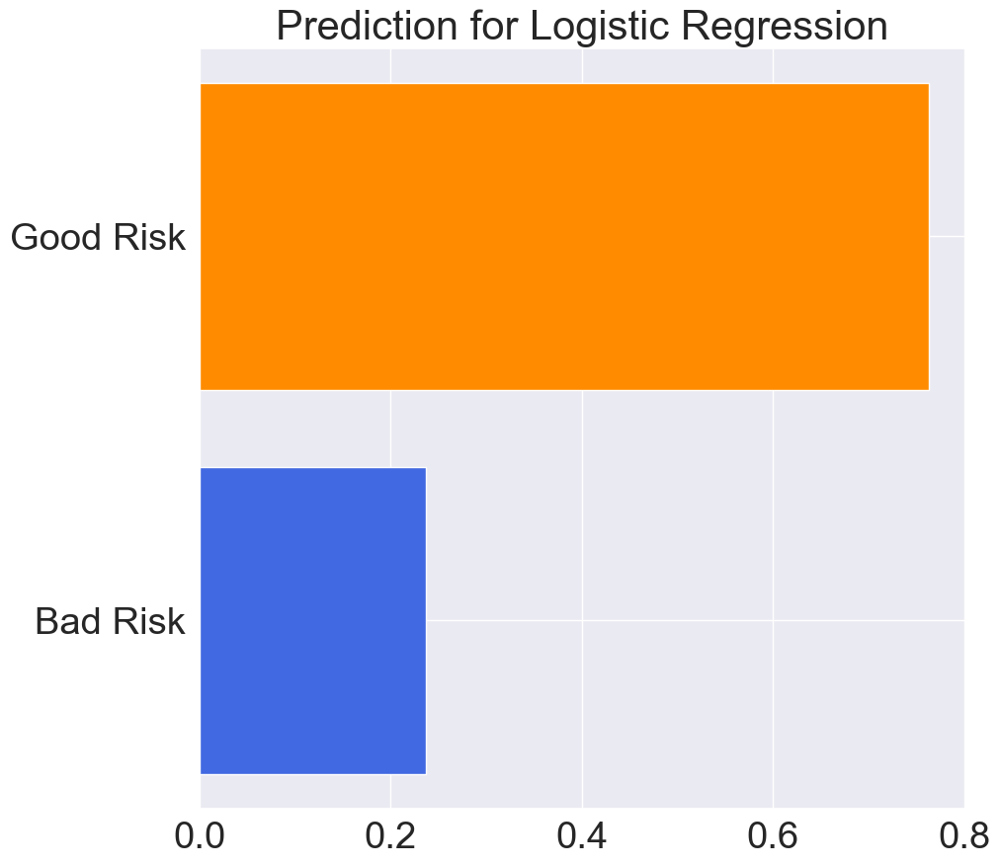

In [138]:
plt.figure(figsize=(10, 10))
color_lr = ['royalblue', 'darkorange']
plt.barh(['Bad Risk', 'Good Risk'], lr_best_grid.predict_proba(X_test.iloc[test_index].to_numpy().reshape(1,-1))[0], color = color_lr)
plt.title("Prediction for Logistic Regression")
plt.show()

# Global SHAP plots for best Random Forest 

In [110]:
test_shap_values = explainer_shap.shap_values(X_test)

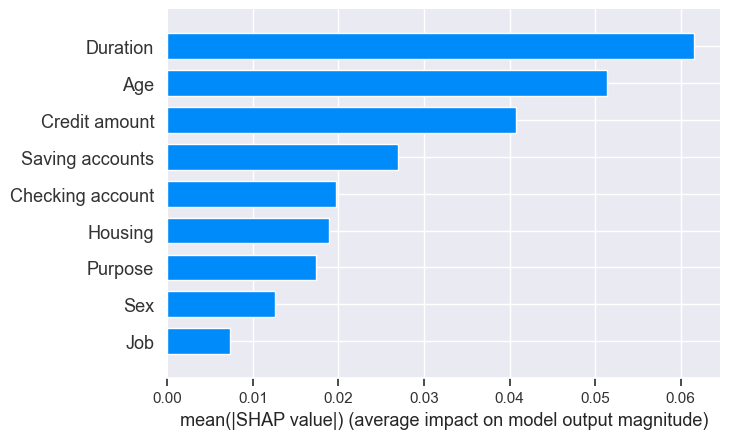

In [111]:
shap.summary_plot(test_shap_values[1][0:100], X_test.iloc[0:100,:], plot_type="bar")

In [112]:
# To create Shapley values visualisations
shap.initjs()  

shap.force_plot(explainer_shap.expected_value[1], test_shap_values[1][0:100], X_test.iloc[0:100,:])

In [113]:
X_test.shape

(200, 9)

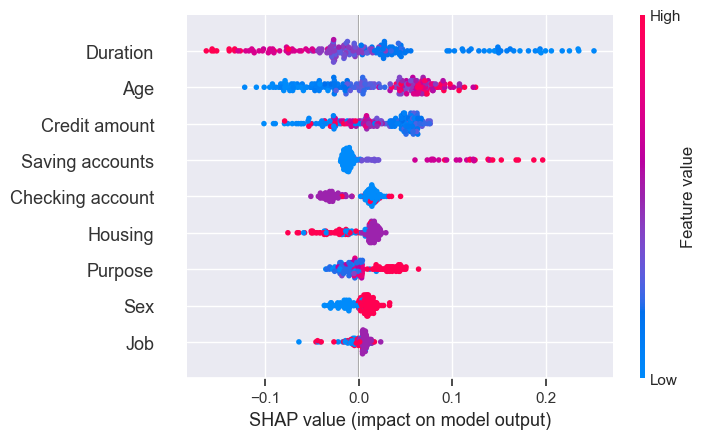

In [114]:
shap.summary_plot(test_shap_values[1][0:199], X_test.iloc[0:199,:])

# Anchors without resample

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from alibi.explainers import AnchorTabular

In [ ]:
german.head()

In [ ]:
#data1 = german

In [ ]:
data1 = pd.read_csv('german_credit_data.csv', index_col=0)
data1


In [ ]:
data1.info()

In [ ]:
data = data1[data1.columns.to_list()[:-1]].to_numpy()
target = data1[data1.columns.to_list()[-1]].to_numpy()
feature_names = data1.columns.to_list()[:-1]
category_map = {}

In [ ]:
# Define training and test data 
split_index = 800
X_train,y_train = data[:split_index,:], target[:split_index]
X_test, y_test = data[split_index+1:,:], target[split_index+1:]

In [ ]:
# Different types of pre-processing can be applied to all or part of the features.  
# This is for ordinal featues.
ordinal_features = [x for x in range(len(feature_names)) if x not in list(category_map.keys())] # Find ordinal features
ordinal_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),            # Strategy = Imputing missing values + Scale the data
                                      ('scaler', StandardScaler())])                            

In [ ]:
# This is for categorical features. 
categorical_features = list(category_map.keys())   # Find ordinal features
categorical_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='mode')),   # Strategy = Imputing missing values + Encode the data
                                          ('onehot', OneHotEncoder(handle_unknown='ignore'))])

In [ ]:
categorical_features

In [ ]:
preprocessor = ColumnTransformer(transformers=[('num', ordinal_transformer, ordinal_features),
                                               ('cat', categorical_transformer, categorical_features)])
preprocessor.fit(X_train) # Apply pre-processing techniques we defined above to right columns


In [ ]:
# Tree based classifier for the classification task
np.random.seed(0)
clf = RandomForestClassifier(n_estimators=50)
clf.fit(preprocessor.transform(X_train), y_train)

In [ ]:
# model predictions on train and test set
y_pred_train = clf.predict(preprocessor.transform(X_train))
y_pred_test = clf.predict(preprocessor.transform(X_test))
# print('Train accuracy: ', accuracy_score(y_train, y_pred_train))
# print('Test accuracy: ', accuracy_score(y_test, y_pred_test))

# Performance of the model (we can use)
predict_fn = lambda x: clf.predict(preprocessor.transform(x))
print('Train accuracy: ', accuracy_score(y_train, predict_fn(X_train)))
print('Test accuracy: ', accuracy_score(y_test, predict_fn(X_test)))

In [ ]:
# Create the Anchor Explainer object with right parameters
explainer = AnchorTabular(predict_fn, feature_names, categorical_names=category_map, seed=1)

In [ ]:
# Fit anchor explainer for the training data (discretize ordinal features into quartiles)
explainer.fit(X_train, disc_perc=[25, 50, 75])

In [ ]:
# Define target variable names and make the prediction

# choose an instance index for the test set
test_idx = 0 
class_names = ['Bad Risk','Good Risk']
print('Prediction: ', class_names[explainer.predictor(X_test[test_idx].reshape(1, -1))[0]])
print('True label: ', class_names[y_test[test_idx]])
print(X_test[test_idx])
# we add the split index to the current test index + 1 to get the feature values from the original dataframe
data1.iloc[[test_idx+split_index+1]]

In [ ]:
explanation = explainer.explain(X_test[test_idx], threshold=0.95) 
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('Coverage: %.2f' % explanation.coverage)
# print instance like we did before
data1.iloc[[test_idx+split_index+1]]

In [ ]:
# Let's try anchor on the new test data sample
test_idx = 4 # You can define the index of the sample in the test data to get explanation why the model get the specific prediction for this sample
print('Prediction: ', class_names[explainer.predictor(X_test[test_idx].reshape(1, -1))[0]])
print('True label: ', class_names[y_test[test_idx]])
print(X_test[test_idx])
data1.iloc[[test_idx+split_index+1]]

In [ ]:
explanation = explainer.explain(X_test[test_idx], threshold=0.95) # We set the precision threshold to 0.95. This means that predictions on observations where the anchor holds will be the same as the prediction on the explained instance at least 95% of the time.
print('Anchor: %s' % (' AND '.join(explanation.anchor))) # Explanation for the person who has diabetes
print('Precision: %.2f' % explanation.precision)
print('Coverage: %.2f' % explanation.coverage)
data1.iloc[[test_idx+split_index+1]]

In [ ]:
# Let's try anchor on the new test data sample
test_idx = 198 # You can define the index of the sample in the test data to get explanation why the model get the specific prediction for this sample
print('Prediction: ', class_names[explainer.predictor(X_test[test_idx].reshape(1, -1))[0]])
print('True label: ', class_names[y_test[test_idx]])
print(X_test[test_idx])
data1.iloc[[test_idx+split_index+1]]
explanation = explainer.explain(X_test[test_idx], threshold=0.95) # We set the precision threshold to 0.95. This means that predictions on observations where the anchor holds will be the same as the prediction on the explained instance at least 95% of the time.
print('Anchor: %s' % (' AND '.join(explanation.anchor))) # Explanation for the person who has diabetes
print('Precision: %.2f' % explanation.precision)
print('Coverage: %.2f' % explanation.coverage)
data1.iloc[[test_idx+split_index+1]]

In [ ]:
X_test.shape

In [ ]:
best_precision = 0
best_coverage = 0
best_index = -1

for j in range(X_test.shape[0]):
    # Let's try anchor on the new test data sample
    test_idx = j # You can define the index of the sample in the test data to get explanation why the model get the specific prediction for this sample
    #print('Prediction: ', class_names[explainer.predictor(X_test[test_idx].reshape(1, -1))[0]])
    #print('True label: ', class_names[y_test[test_idx]])
    #print(X_test[test_idx])
    #data1.iloc[[test_idx+split_index+1]]
    explanation = explainer.explain(X_test[test_idx], threshold=0.70) # We set the precision threshold to 0.90. This means that predictions on observations where the anchor holds will be the same as the prediction on the explained instance at least 90% of the time.
    #print('Anchor: %s' % (' AND '.join(explanation.anchor))) # Explanation for the person who has diabetes
    #print('Precision: %.2f' % explanation.precision)
    #print('Coverage: %.2f' % explanation.coverage)
    #data1.iloc[[test_idx+split_index+1]]
    if explanation.coverage > best_coverage:
        best_coverage = explanation.coverage
        best_precision = explanation.precision
        best_index = j

In [ ]:
best_index

In [ ]:
# Let's try anchor on the new test data sample
test_idx = best_index # You can define the index of the sample in the test data to get explanation why the model get the specific prediction for this sample
print('Prediction: ', class_names[explainer.predictor(X_test[test_idx].reshape(1, -1))[0]])
print('True label: ', class_names[y_test[test_idx]])
print(X_test[test_idx])
data1.iloc[[test_idx+split_index+1]]
explanation = explainer.explain(X_test[test_idx], threshold=0.95) # We set the precision threshold to 0.95. This means that predictions on observations where the anchor holds will be the same as the prediction on the explained instance at least 95% of the time.
print('Anchor: %s' % (' AND '.join(explanation.anchor))) # Explanation for the person who has diabetes
print('Precision: %.2f' % explanation.precision)
print('Coverage: %.2f' % explanation.coverage)
data1.iloc[[test_idx+split_index+1]]

# Testing anchors

In [ ]:
test_idx = 0

In [ ]:
# Let's try anchor on the new test data sample
test_idx = test_idx +1  # You can define the index of the sample in the test data to get explanation why the model get the specific prediction for this sample
#print('Prediction: ', class_names[explainer.predictor(X_test[test_idx].reshape(1, -1))[0]])
#print('True label: ', class_names[y_test[test_idx]])
print(X_test[test_idx])
data1.iloc[[test_idx+split_index+1]]
explanation = explainer.explain(X_test[test_idx], threshold=0.95) # We set the precision threshold to 0.95. This means that predictions on observations where the anchor holds will be the same as the prediction on the explained instance at least 95% of the time.
#print('Anchor: %s' % (' AND '.join(explanation.anchor))) # Explanation for the person who has diabetes
print('Precision: %.2f' % explanation.precision)
print('Coverage: %.2f' % explanation.coverage)
#data1.iloc[[test_idx+split_index+1]]

In [ ]:
print (test_idx)

In [ ]:
# Let's try anchor on the new test data sample
test_idx = 98  # You can define the index of the sample in the test data to get explanation why the model get the specific prediction for this sample
print('Prediction: ', class_names[explainer.predictor(X_test[test_idx].reshape(1, -1))[0]])
print('True label: ', class_names[y_test[test_idx]])
print(X_test[test_idx])
data1.iloc[[test_idx+split_index+1]]
explanation = explainer.explain(X_test[test_idx], threshold=0.95) # We set the precision threshold to 0.95. This means that predictions on observations where the anchor holds will be the same as the prediction on the explained instance at least 95% of the time.
print('Anchor: %s' % (' AND '.join(explanation.anchor))) # Explanation for the person who has diabetes
print('Precision: %.2f' % explanation.precision)
print('Coverage: %.2f' % explanation.coverage)
#data1.iloc[[test_idx+split_index+1]]

# List of indices which give good anchors

19, 24, 37, 42, 79, 83, 98,

# PCA (not relevant, just interesting)

In [ ]:
n_components = 9

pca = PCA(n_components = n_components, random_state = 42)

pca.fit(X)
print(pca.explained_variance_ratio_)
print(f'PCA score: {pca.score(X)}')

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

#### Using only 1 Principal component we capture all the variance in the dataset. This is irrelevant to this assignment, but still interesting

# T-SNE

In [ ]:
# time_start = time.time()
# tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
# tsne_results = tsne.fit_transform(X)

# print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))
# A  = tsne_results[:,0]
# B  = tsne_results[:,1]


# plt.figure(figsize=(16,10))
# sns.scatterplot(data=tsne_results,
#     legend="full",
#     alpha=0.3
# )

In [163]:
german_classifier(RandomForestClassifier(random_state=42), X_train, y_train, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.57      0.28      0.38        60
           1       0.75      0.91      0.82       140

    accuracy                           0.72       200
   macro avg       0.66      0.60      0.60       200
weighted avg       0.69      0.72      0.69       200

The F0.5 score is:0.7743902439024389

The F2 score is:0.8698630136986302

The ROC AUC score is: 0.5952380952380951

----------------------------------------------------------------------------------------------------


# Testing all the classifiers to compare results

### Our Classifier list. Every classifier hereunder will be fitted to the dataset

In [82]:
classifier_list=[RandomForestClassifier(random_state=42), 
                 LogisticRegression(random_state=42),
                 LogisticRegression(random_state = 42, penalty='l2', class_weight={0:1.24, 1:1}, solver='liblinear'),
                 LinearSVC(random_state=42),
                 GradientBoostingClassifier(random_state=42),
                 XGBClassifier(random_state=42),
                 DecisionTreeClassifier(random_state=42)]

# Raw data

In [295]:
for cl in classifier_list:
    german_classifier(cl, X_train, y_train, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.57      0.28      0.38        60
           1       0.75      0.91      0.82       140

    accuracy                           0.72       200
   macro avg       0.66      0.60      0.60       200
weighted avg       0.69      0.72      0.69       200

The F0.5 score is:0.7743902439024389

The F2 score is:0.8698630136986302

The ROC AUC score is: 0.5952380952380951

----------------------------------------------------------------------------------------------------

PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


              precision    recall  f1-score   support

           0       0.31      0.08      0.13        60
           1       0.70      0.92      0.80       140

    accuracy                           0.67       200
   macro avg       0.51      0.50      0.46       200
weighted avg       0.58      0.67 

# Random Oversampling

In [63]:
for cl in classifier_list:
    german_classifier(cl, X_train_res, y_train_res, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.47      0.38      0.42        60
           1       0.75      0.81      0.78       140

    accuracy                           0.69       200
   macro avg       0.61      0.60      0.60       200
weighted avg       0.67      0.69      0.68       200

The F0.5 score is:0.7661290322580645

The F2 score is:0.80168776371308

The ROC AUC score is: 0.5988095238095238

----------------------------------------------------------------------------------------------------

PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


              precision    recall  f1-score   support

           0       0.43      0.60      0.50        60
           1       0.79      0.66      0.72       140

    accuracy                           0.65       200
   macro avg       0.61      0.63      0.61       200
weighted avg       0.69      0.65   

# SMOTE oversampling

In [64]:
ros_smote = SMOTE(random_state=42)

X_train_res_smote, y_train_res_smote = ros_smote.fit_resample(X_train, y_train)

# X_train_res_smote, X_test_res_smote, y_train_res_smote, y_test_res_smote = train_test_split(X_res_smote, 
#                                                                     y_res_smote, 
#                                                                     test_size=0.2,
#                                                                     stratify = y_res_smote,
#                                                                     random_state=42)

print(X_train_res_smote.shape)
print(y_train_res_smote.shape)
print(X_test.shape)
print(y_test.shape)

(1120, 9)
(1120,)
(200, 9)
(200,)


In [65]:
for cl in classifier_list:
    german_classifier(cl, X_train_res_smote, y_train_res_smote, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.50      0.37      0.42        60
           1       0.76      0.84      0.80       140

    accuracy                           0.70       200
   macro avg       0.63      0.60      0.61       200
weighted avg       0.68      0.70      0.69       200

The F0.5 score is:0.7722513089005236

The F2 score is:0.8240223463687151

The ROC AUC score is: 0.6047619047619048

----------------------------------------------------------------------------------------------------

PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


              precision    recall  f1-score   support

           0       0.44      0.47      0.46        60
           1       0.77      0.75      0.76       140

    accuracy                           0.67       200
   macro avg       0.61      0.61      0.61       200
weighted avg       0.67      0.67 

# ADASYN oversampling

In [66]:
ros_adasyn = ADASYN(random_state=42)

X_train_res_adasyn, y_train_res_adasyn = ros_adasyn.fit_resample(X_train, y_train)

# X_train_res_adasyn, X_test_res_adasyn, y_train_res_adasyn, y_test_res_adasyn = train_test_split(X_res_adasyn, 
#                                                                     y_res_adasyn, 
#                                                                     test_size=0.2,
#                                                                     stratify = y_res_adasyn,
#                                                                     random_state=42)

print(X_train_res_adasyn.shape)
print(y_train_res_adasyn.shape)
print(X_test.shape)
print(y_test.shape)

(1138, 9)
(1138,)
(200, 9)
(200,)


In [67]:
for cl in classifier_list:
    german_classifier(cl, X_train_res_adasyn, y_train_res_adasyn, X_test, y_test)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.46      0.40      0.43        60
           1       0.76      0.80      0.78       140

    accuracy                           0.68       200
   macro avg       0.61      0.60      0.60       200
weighted avg       0.67      0.68      0.67       200

The F0.5 score is:0.7650273224043717

The F2 score is:0.7909604519774013

The ROC AUC score is: 0.6000000000000001

----------------------------------------------------------------------------------------------------

PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


              precision    recall  f1-score   support

           0       0.48      0.57      0.52        60
           1       0.80      0.74      0.77       140

    accuracy                           0.69       200
   macro avg       0.64      0.65      0.64       200
weighted avg       0.70      0.69 

# Cross validation raw data

In [68]:
start = time.time()

for cl in classifier_list:
    german_classifier_cross_val(cl, X, y)
    
    
    
end = time.time()    

print(f'The time to run all cross validation models was: {end-start} seconds')


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


The max cross validation score is: 0.8
              precision    recall  f1-score   support

           0       0.52      0.27      0.36       300
           1       0.74      0.89      0.81       700

    accuracy                           0.71      1000
   macro avg       0.63      0.58      0.58      1000
weighted avg       0.68      0.71      0.67      1000

The F0.5 score is:0.7674361493123774

The F2 score is:0.8578094976667583

The ROC AUC score is: 0.5830952380952381

----------------------------------------------------------------------------------------------------

PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


The max cross validation score is: 0.73
              precision    recall  f1-score   support

           0       0.57      0.14      0.22       300
           1       0.72      0.96      0.82       700

    accuracy                           0.71      1000
   macro 

# Cross validation resampled data -> leads to overestimation of metrics, so not very applicable!

In [69]:
ros = RandomOverSampler(random_state=42)

X_res, y_res = ros.fit_resample(X, y)

In [70]:
start = time.time()

for cl in classifier_list:
    german_classifier_cross_val(cl, X_res, y_res)
    
    
    
end = time.time()    

print(f'The time to run all cross validation models was: {end-start} seconds')


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


The max cross validation score is: 0.9
              precision    recall  f1-score   support

           0       0.81      0.92      0.87       700
           1       0.91      0.79      0.85       700

    accuracy                           0.86      1400
   macro avg       0.86      0.86      0.86      1400
weighted avg       0.86      0.86      0.86      1400

The F0.5 score is:0.8846153846153847

The F2 score is:0.8105726872246697

The ROC AUC score is: 0.8564285714285715

----------------------------------------------------------------------------------------------------

PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


The max cross validation score is: 0.6785714285714286
              precision    recall  f1-score   support

           0       0.61      0.57      0.59       700
           1       0.60      0.64      0.62       700

    accuracy                           0.61      

# Random oversampling, dropped Sex

In [71]:
german.head()

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
0,67,1,2,1,0,0,1169,6,5,1
1,22,0,2,1,0,1,5951,48,5,0
2,49,1,1,1,0,0,2096,12,3,1
3,45,1,2,0,0,0,7882,42,4,1
4,53,1,2,0,0,0,4870,24,1,0


In [72]:
dropped_cols_sex = ['Risk', 'Sex'] ### variable columns to be dropped from german credit dataset  

X_dropped_sex = german.drop(dropped_cols_sex, axis=1)
y_dropped_sex = german['Risk']

X_dropped_sex.head()

,Age,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose
0,67,2,1,0,0,1169,6,5
1,22,2,1,0,1,5951,48,5
2,49,1,1,0,0,2096,12,3
3,45,2,0,0,0,7882,42,4
4,53,2,0,0,0,4870,24,1


In [73]:
X_train_res_dropped_sex, X_test_res_dropped_sex, y_train_res_dropped_sex, y_test_res_dropped_sex = train_test_split(X_dropped_sex, 
                                                                                                    y_dropped_sex, 
                                                                                                    test_size=0.2,
                                                                                                    stratify = y_dropped_sex,
                                                                                                    random_state=42)

In [74]:
ros = RandomOverSampler(random_state=42)

X_train_res_dropped_sex, y_train_res_dropped_sex = ros.fit_resample(X_train_res_dropped_sex, y_train_res_dropped_sex)

print(X_train_res_dropped_sex.shape)
print(y_train_res_dropped_sex.shape)
print(X_test_res_dropped_sex.shape)
print(y_test_res_dropped_sex.shape)

(1120, 8)
(1120,)
(200, 8)
(200,)


In [75]:
for cl in classifier_list:
    german_classifier(cl, X_train_res_dropped_sex, y_train_res_dropped_sex, X_test_res_dropped_sex, y_test_res_dropped_sex)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.43      0.35      0.39        60
           1       0.74      0.80      0.77       140

    accuracy                           0.67       200
   macro avg       0.59      0.57      0.58       200
weighted avg       0.65      0.67      0.65       200

The F0.5 score is:0.7526881720430108

The F2 score is:0.787623066104079

The ROC AUC score is: 0.575

----------------------------------------------------------------------------------------------------

PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


              precision    recall  f1-score   support

           0       0.39      0.60      0.47        60
           1       0.78      0.59      0.67       140

    accuracy                           0.59       200
   macro avg       0.58      0.60      0.57       200
weighted avg       0.66      0.59      0.61     

In [76]:
# Cross val on dropped data does not produce better results

# start = time.time()

# for cl in classifier_list:
#     german_classifier_cross_val(cl, X_dropped_sex, y_dropped_sex)
    
    
    
# end = time.time()    

# print(f'The time to run all cross validation models was: {end-start} seconds')

# Random oversampling, dropped Age

In [77]:
german.head()

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
0,67,1,2,1,0,0,1169,6,5,1
1,22,0,2,1,0,1,5951,48,5,0
2,49,1,1,1,0,0,2096,12,3,1
3,45,1,2,0,0,0,7882,42,4,1
4,53,1,2,0,0,0,4870,24,1,0


In [78]:
dropped_cols_age = ['Risk', 'Age'] ### variable columns to be dropped from german credit dataset  

X_dropped_age = german.drop(dropped_cols_sex, axis=1)
y_dropped_age = german['Risk']

X_dropped_age.head()

,Age,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose
0,67,2,1,0,0,1169,6,5
1,22,2,1,0,1,5951,48,5
2,49,1,1,0,0,2096,12,3
3,45,2,0,0,0,7882,42,4
4,53,2,0,0,0,4870,24,1


In [79]:
X_train_res_dropped_age, X_test_res_dropped_age, y_train_res_dropped_age, y_test_res_dropped_age = train_test_split(X_dropped_age, 
                                                                                                    y_dropped_age, 
                                                                                                    test_size=0.2,
                                                                                                    stratify = y_dropped_age,
                                                                                                    random_state=42)

In [80]:
ros = RandomOverSampler(random_state=42)

X_train_res_dropped_age, y_train_res_dropped_age = ros.fit_resample(X_train_res_dropped_age, y_train_res_dropped_age)

print(X_train_res_dropped_age.shape)
print(y_train_res_dropped_age.shape)
print(X_test_res_dropped_age.shape)
print(y_test_res_dropped_age.shape)

(1120, 8)
(1120,)
(200, 8)
(200,)


In [81]:
for cl in classifier_list:
    german_classifier(cl, X_train_res_dropped_age, y_train_res_dropped_age, X_test_res_dropped_age, y_test_res_dropped_age)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.43      0.35      0.39        60
           1       0.74      0.80      0.77       140

    accuracy                           0.67       200
   macro avg       0.59      0.57      0.58       200
weighted avg       0.65      0.67      0.65       200

The F0.5 score is:0.7526881720430108

The F2 score is:0.787623066104079

The ROC AUC score is: 0.575

----------------------------------------------------------------------------------------------------

PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


              precision    recall  f1-score   support

           0       0.39      0.60      0.47        60
           1       0.78      0.59      0.67       140

    accuracy                           0.59       200
   macro avg       0.58      0.60      0.57       200
weighted avg       0.66      0.59      0.61     

# Random oversampled, dropped Sex and Age

In [82]:
german.head()

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
0,67,1,2,1,0,0,1169,6,5,1
1,22,0,2,1,0,1,5951,48,5,0
2,49,1,1,1,0,0,2096,12,3,1
3,45,1,2,0,0,0,7882,42,4,1
4,53,1,2,0,0,0,4870,24,1,0


In [83]:
dropped_cols2 = ['Risk', 'Age', 'Sex'] ### variable columns to be dropped from german credit dataset  

X_dropped_sex_age = german.drop(dropped_cols2, axis=1)
y_dropped_sex_age = german['Risk']

X_dropped_sex_age.head()

,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose
0,2,1,0,0,1169,6,5
1,2,1,0,1,5951,48,5
2,1,1,0,0,2096,12,3
3,2,0,0,0,7882,42,4
4,2,0,0,0,4870,24,1


In [84]:
X_train_res_dropped_sex_age, X_test_res_dropped_sex_age, y_train_res_dropped_sex_age, y_test_res_dropped_sex_age = train_test_split(X_dropped_sex_age, 
                                                                                                    y_dropped_sex_age, 
                                                                                                    test_size=0.2,
                                                                                                    stratify = y_dropped_sex_age,
                                                                                                    random_state=42)

In [85]:
ros = RandomOverSampler(random_state=42)

X_train_res_dropped_sex_age, y_train_res_dropped_sex_age = ros.fit_resample(X_train_res_dropped_sex_age, y_train_res_dropped_sex_age)

print(X_train_res_dropped_sex_age.shape)
print(y_train_res_dropped_sex_age.shape)
print(X_test_res_dropped_sex_age.shape)
print(y_test_res_dropped_sex_age.shape)

(1120, 7)
(1120,)
(200, 7)
(200,)


In [86]:
for cl in classifier_list:
    german_classifier(cl, X_train_res_dropped_sex_age, y_train_res_dropped_sex_age, X_test_res_dropped_sex_age, y_test_res_dropped_sex_age)


PRINTING RESULTS FOR CLASSIFIER: RandomForestClassifier(random_state=42):


              precision    recall  f1-score   support

           0       0.37      0.38      0.38        60
           1       0.73      0.72      0.73       140

    accuracy                           0.62       200
   macro avg       0.55      0.55      0.55       200
weighted avg       0.62      0.62      0.62       200

The F0.5 score is:0.7297687861271677

The F2 score is:0.7234957020057307

The ROC AUC score is: 0.5523809523809524

----------------------------------------------------------------------------------------------------

PRINTING RESULTS FOR CLASSIFIER: LogisticRegression(random_state=42):


              precision    recall  f1-score   support

           0       0.39      0.63      0.48        60
           1       0.78      0.57      0.66       140

    accuracy                           0.59       200
   macro avg       0.59      0.60      0.57       200
weighted avg       0.67      0.59 

### Decision Tree plot, oversample, no columns dropped

In [99]:
dt_res = DecisionTreeClassifier(random_state=42)

dt_res.fit(X_train_res, y_train_res)

preds_dt_res = dt_res.predict(X_test)

print(classification_report(y_test, preds_dt_res))
print(f'The F0.5 score is:{fbeta_score(y_test, preds_dt_res, beta=0.5)}\n')
print(f'The F2 score is:{fbeta_score(y_test, preds_dt_res, beta=2.0)}\n')
print(f'The ROC AUC score is: {roc_auc_score(y_test, preds_dt_res)}\n')
print('-'*100)



              precision    recall  f1-score   support

           0       0.34      0.33      0.34        60
           1       0.72      0.72      0.72       140

    accuracy                           0.60       200
   macro avg       0.53      0.53      0.53       200
weighted avg       0.60      0.60      0.60       200

The F0.5 score is:0.7173295454545454

The F2 score is:0.7203994293865905

The ROC AUC score is: 0.5273809523809524

----------------------------------------------------------------------------------------------------


In [100]:
class_names = ['Bad Risk', 'Good Risk']

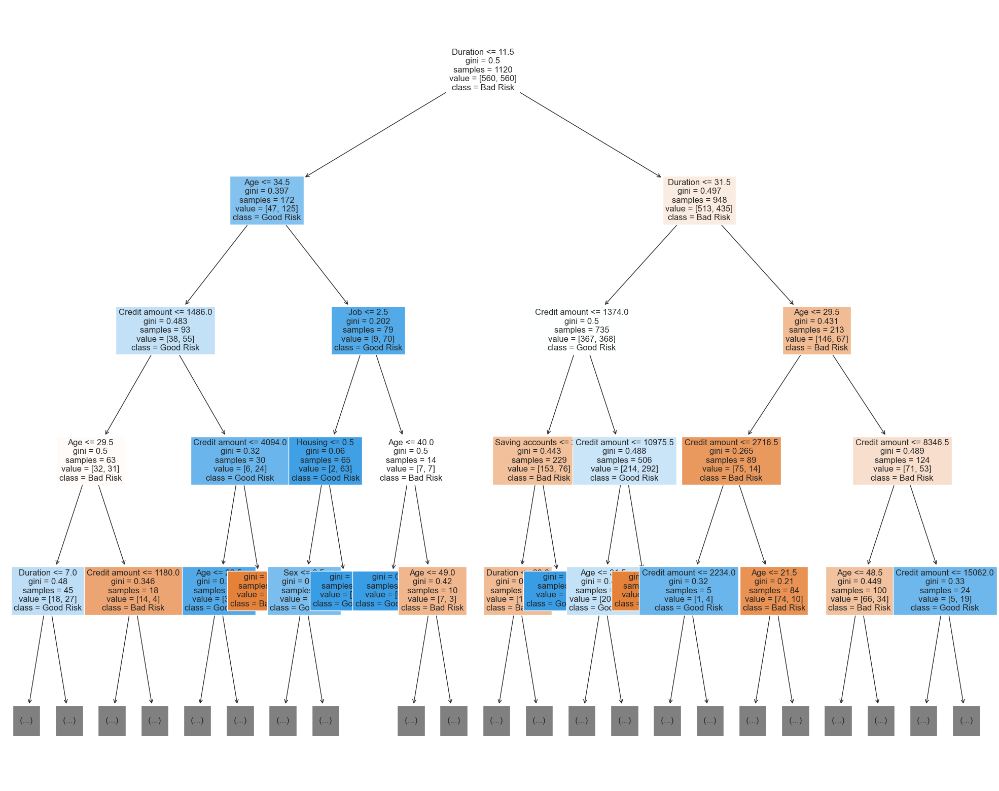

In [101]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(dt_res, 
                   feature_names=X_train_res.columns,  
                   class_names=class_names,
                   max_depth = 4,
                   fontsize = 12,
                   filled=True)


In [102]:
start = time.time()

params = {'max_depth': [2,4,6,8,10,12],
         'min_samples_split': [2,3,4],
         'min_samples_leaf': [1,2]}

dt = DecisionTreeClassifier(random_state=42)
gcv = GridSearchCV(estimator=dt, param_grid=params)
gcv.fit(X_train_res, y_train_res)

end = time.time()

print(f'The time to run the Grid Search for Decision Tree Classifier was: {end-start} seconds')

The time to run the Grid Search for Decision Tree Classifier was: 1.160609245300293 seconds


In [ ]:
gcv.best_estimator_

In [103]:
dt_res_pruned = gcv.best_estimator_

dt_res_pruned.fit(X_train_res, y_train_res)

preds_dt_res_pruned = dt_res_pruned.predict(X_test)

print(classification_report(y_test, preds_dt_res_pruned))
print(f'The F0.5 score is:{fbeta_score(y_test, preds_dt_res_pruned, beta=0.5)}\n')
print(f'The F2 score is:{fbeta_score(y_test, preds_dt_res_pruned, beta=2.0)}\n')
print(f'The ROC AUC score is: {roc_auc_score(y_test, preds_dt_res_pruned)}\n')
print('-'*100)



              precision    recall  f1-score   support

           0       0.31      0.35      0.33        60
           1       0.70      0.66      0.68       140

    accuracy                           0.57       200
   macro avg       0.51      0.51      0.51       200
weighted avg       0.59      0.57      0.58       200

The F0.5 score is:0.6961077844311377

The F2 score is:0.6719653179190751

The ROC AUC score is: 0.5071428571428571

----------------------------------------------------------------------------------------------------


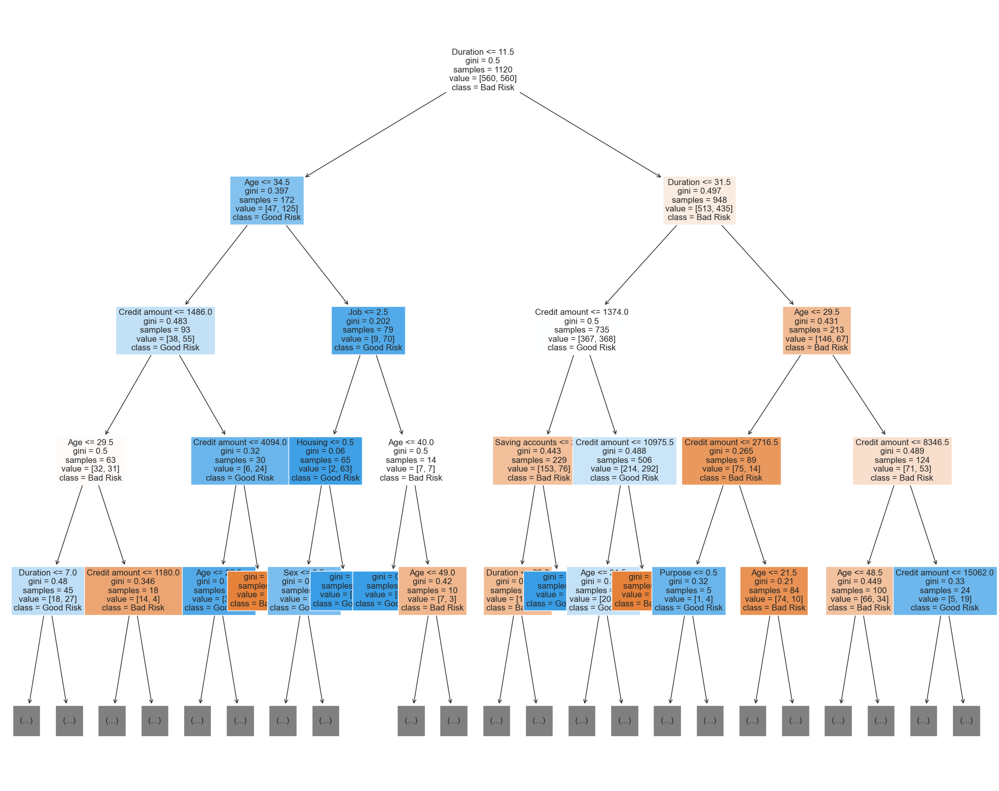

In [104]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(dt_res_pruned, 
                   feature_names=X_train_res.columns,  
                   class_names=class_names,
                   max_depth = 4, 
                   fontsize = 12,
                   filled=True)


In [105]:
dt_res_pruned = DecisionTreeClassifier(random_state=42, max_depth=4, min_samples_split=10, min_samples_leaf=10)

dt_res_pruned.fit(X_train_res, y_train_res)

preds_dt_res_pruned = dt_res_pruned.predict(X_test)

print(classification_report(y_test, preds_dt_res_pruned))
print(f'The F0.5 score is:{fbeta_score(y_test, preds_dt_res_pruned, beta=0.5)}\n')
print(f'The F2 score is:{fbeta_score(y_test, preds_dt_res_pruned, beta=2.0)}\n')
print(f'The ROC AUC score is: {roc_auc_score(y_test, preds_dt_res_pruned)}\n')
print('-'*100)



              precision    recall  f1-score   support

           0       0.41      0.42      0.41        60
           1       0.75      0.74      0.75       140

    accuracy                           0.65       200
   macro avg       0.58      0.58      0.58       200
weighted avg       0.65      0.65      0.65       200

The F0.5 score is:0.7471264367816093

The F2 score is:0.7439198855507869

The ROC AUC score is: 0.5797619047619047

----------------------------------------------------------------------------------------------------


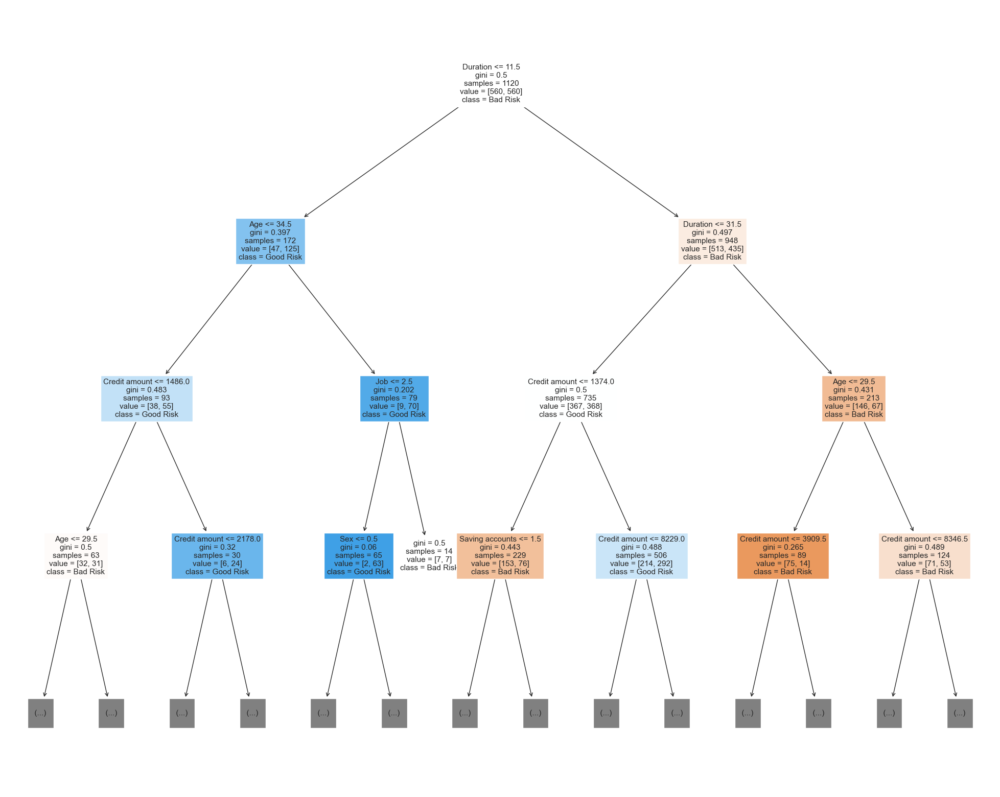

In [106]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(dt_res_pruned, 
                   feature_names=X_train_res.columns,  
                   class_names=class_names,
                   fontsize=11,
                   max_depth = 3,
                   filled=True)


### feature selection methods to see which features are important 

In [ ]:
### PRODUCES DIFFERENT RESULT EACH TIME!!!!!!!!!!!!!!!!!!

meth = mutual_info_classif
skb = SelectKBest(meth, k=4)
skb.fit(X, y)
X_new = skb.transform(X)

X_new.shape

X.columns[skb.get_support(indices=True)].tolist()

In [ ]:
meth = chi2
skb = SelectKBest(meth, k=4)
skb.fit(X, y)
X_new = skb.transform(X)

X_new.shape

X.columns[skb.get_support(indices=True)].tolist()

In [ ]:
X_train_res.shape

In [ ]:
roc_auc_list = []
for k in range(1, X_train_res.shape[1]):

    rf_skb = RandomForestClassifier(random_state=42)
    pipeClassifier = make_pipeline(SelectKBest(chi2, k = k), rf_skb)
    pipeClassifier.fit(X_train_res, y_train_res)
    y_pred_rf_skb = pipeClassifier.predict(X_test_res)
    roc_auc_list.append(roc_auc_score(y_test_res, y_pred_rf_skb))
    
    
    
max_roc_auc_index = roc_auc_list.index(max(roc_auc_list))

print(max_roc_auc_index)

print(max(roc_auc_list))
    
    

In [ ]:
selector = SelectKBest(chi2, k=4)

rf_skb = RandomForestClassifier(random_state=42)
pipeClassifier = make_pipeline(selector, rf_skb)
pipeClassifier.fit(X_train_res, y_train_res)
y_pred_rf_skb = pipeClassifier.predict(X_test_res)


print(roc_auc_score(y_test_res, y_pred_rf_skb))

print(selector.get_support(indices=True))
    

out = pd.DataFrame({'Features': X_train_res.columns[selector.get_support()]})

dataframe_columns = pd.DataFrame(X_train_res.columns)
ranking = pd.concat([dataframe_columns], axis=1)
ranking.columns = ["Features"]

ranking[selector.get_support()]    

# Grid Search for Logistic Regression

In [108]:
weight_list = []
weights = np.arange(1.0, 2.45, 0.05)
for w in weights:
    z = {0:w, 1:1}
    weight_list.append(z)
    
print(weight_list)    
    

[{0: 1.0, 1: 1}, {0: 1.05, 1: 1}, {0: 1.1, 1: 1}, {0: 1.1500000000000001, 1: 1}, {0: 1.2000000000000002, 1: 1}, {0: 1.2500000000000002, 1: 1}, {0: 1.3000000000000003, 1: 1}, {0: 1.3500000000000003, 1: 1}, {0: 1.4000000000000004, 1: 1}, {0: 1.4500000000000004, 1: 1}, {0: 1.5000000000000004, 1: 1}, {0: 1.5500000000000005, 1: 1}, {0: 1.6000000000000005, 1: 1}, {0: 1.6500000000000006, 1: 1}, {0: 1.7000000000000006, 1: 1}, {0: 1.7500000000000007, 1: 1}, {0: 1.8000000000000007, 1: 1}, {0: 1.8500000000000008, 1: 1}, {0: 1.9000000000000008, 1: 1}, {0: 1.9500000000000008, 1: 1}, {0: 2.000000000000001, 1: 1}, {0: 2.0500000000000007, 1: 1}, {0: 2.100000000000001, 1: 1}, {0: 2.1500000000000012, 1: 1}, {0: 2.200000000000001, 1: 1}, {0: 2.250000000000001, 1: 1}, {0: 2.300000000000001, 1: 1}, {0: 2.3500000000000014, 1: 1}, {0: 2.4000000000000012, 1: 1}, {0: 2.450000000000001, 1: 1}]


In [109]:
best_roc_auc = 0.5
best_wei = 1
weights = np.arange(0.3, 1.5, 0.01)

for w in weights:   
    wei = {0:w, 1:1}
    lr = LogisticRegression(random_state=42, solver = 'liblinear', class_weight = wei)
    lr.fit(X_train_res, y_train_res)

    pre = lr.predict(X_test)

    #print(classification_report(y_test, pre))

    #print(roc_auc_score(y_test, pre))
    if roc_auc_score(y_test, pre) > best_roc_auc:
        best_roc_auc = roc_auc_score(y_test, pre)
        best_wei = w
        
        
print(best_wei)
print(best_roc_auc)

1.1400000000000008
0.6595238095238096


In [89]:
  
wei = {0:1.14, 1:1}
lr = LogisticRegression(random_state=42, solver = 'liblinear', class_weight = wei)
lr.fit(X_train_res, y_train_res)

pre = lr.predict(X_test)

print(classification_report(y_test, pre))

print(f'The roc auc score is: {roc_auc_score(y_test, pre)}')

print(fbeta_score(y_test, pre, beta=0.5))

print(fbeta_score(y_test, pre, beta=2))


              precision    recall  f1-score   support

           0       0.43      0.73      0.54        60
           1       0.84      0.59      0.69       140

    accuracy                           0.63       200
   macro avg       0.63      0.66      0.62       200
weighted avg       0.72      0.63      0.65       200

The roc auc score is: 0.6595238095238096
0.7706766917293233
0.6231003039513677


In [111]:
start = time.time()

params = {'penalty': ['l2'],
         'class_weight': weight_list}

lr_cv = LogisticRegression(random_state=42, solver = 'liblinear')
gcv_lr = GridSearchCV(estimator=lr_cv, param_grid=params, error_score=0.0)
gcv_lr.fit(X_train_res, y_train_res)

end = time.time()

print(f'The time to run the Grid Search for Logistic Regression was: {end-start} seconds')

The time to run the Grid Search for Logistic Regression was: 1.18109130859375 seconds


In [112]:
gcv_lr.best_estimator_

LogisticRegression(class_weight={0: 1.0, 1: 1}, random_state=42,
                   solver='liblinear')

In [113]:
lr_best_grid = gcv_lr.best_estimator_

lr_best_grid.fit(X_train_res, y_train_res)

preds_lr_best_grid = lr_best_grid.predict(X_test)

print(classification_report(y_test, preds_lr_best_grid))

print(f'The ROC AUC score is: {roc_auc_score(y_test, preds_lr_best_grid)}\n')

              precision    recall  f1-score   support

           0       0.43      0.58      0.49        60
           1       0.79      0.66      0.72       140

    accuracy                           0.64       200
   macro avg       0.61      0.62      0.61       200
weighted avg       0.68      0.64      0.65       200

The ROC AUC score is: 0.6238095238095237



In [237]:
lr_best_grid.coef_[0]

array([ 2.07932495e-02,  3.93300857e-01,  1.23275001e-01, -1.00459282e-01,
        3.54177347e-01, -2.87925205e-01,  3.16265640e-05, -4.28758698e-02,
        6.36133940e-02])

In [238]:
features = pd.DataFrame(lr_best_grid.coef_[0], X.columns, columns=['coefficient'])
features

,coefficient
Age,0.020793
Sex,0.393301
Job,0.123275
Housing,-0.100459
Saving accounts,0.354177
Checking account,-0.287925
Credit amount,0.000032
Duration,-0.042876
Purpose,0.063613


In [239]:
# However, some of the features are on the different scale. We have to fix it to safely compare coefficients of features and get insight about their relative importance
stdevs = []
stdevs = []
for i in X.columns:
    stdev = german[i].std()
    stdevs.append(stdev)
features["stdev"] = np.array(stdevs).reshape(-1,1)
features["importance"] = features["coefficient"] * features["stdev"]

In [240]:
features

,coefficient,stdev,importance
Age,0.020793,11.375469,0.236533
Sex,0.393301,0.462725,0.181990
Job,0.123275,0.653614,0.080574
Housing,-0.100459,0.531264,-0.053370
Saving accounts,0.354177,0.805307,0.285222
Checking account,-0.287925,0.604434,-0.174032
Credit amount,0.000032,2822.736876,0.089273
Duration,-0.042876,12.058814,-0.517032
Purpose,0.063613,1.978138,0.125836


In [241]:
# Normalize the importance columns to make the comparison more understandable
features['importance_normalized'] = 100*features['importance'] / features['importance'].abs().max()

In [247]:
features

,coefficient,stdev,importance,importance_normalized
Age,0.020793,11.375469,0.236533,45.748210
Sex,0.393301,0.462725,0.181990,35.198972
Job,0.123275,0.653614,0.080574,15.583994
Housing,-0.100459,0.531264,-0.053370,-10.322449
Saving accounts,0.354177,0.805307,0.285222,55.165143
Checking account,-0.287925,0.604434,-0.174032,-33.659754
Credit amount,0.000032,2822.736876,0.089273,17.266521
Duration,-0.042876,12.058814,-0.517032,-100.000000
Purpose,0.063613,1.978138,0.125836,24.338149


In [251]:
sorted_features = features.sort_values(by = ['importance_normalized'])

In [256]:
sorted_features['importance_normalized_abs'] = sorted_features['importance_normalized'].abs()
sorted_features = sorted_features.sort_values(by = ['importance_normalized_abs'])

Text(0.5, 1.0, 'Coefficient Importance for Logistic Regression')

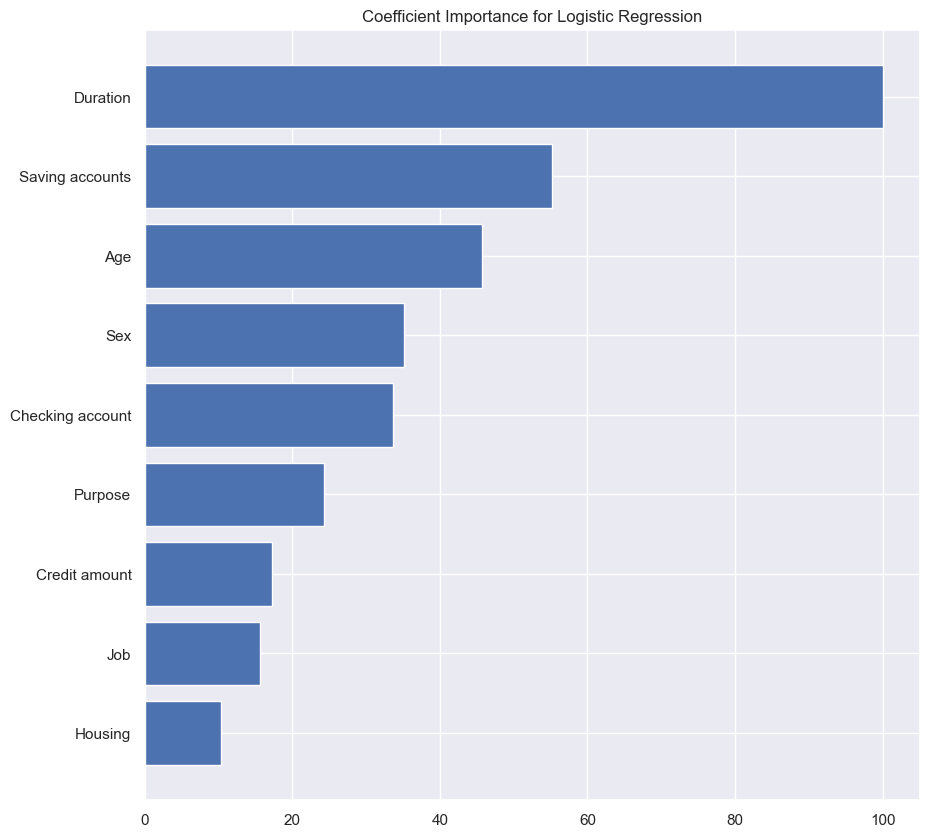

In [258]:
# Show the impact of the features to predict whether the patient has a diabates on the bar graph
plt.figure(figsize=(10, 10))
plt.barh(sorted_features.index, sorted_features.importance_normalized_abs)
plt.title("Coefficient Importance for Logistic Regression")

In [ ]:
lr_best_grid

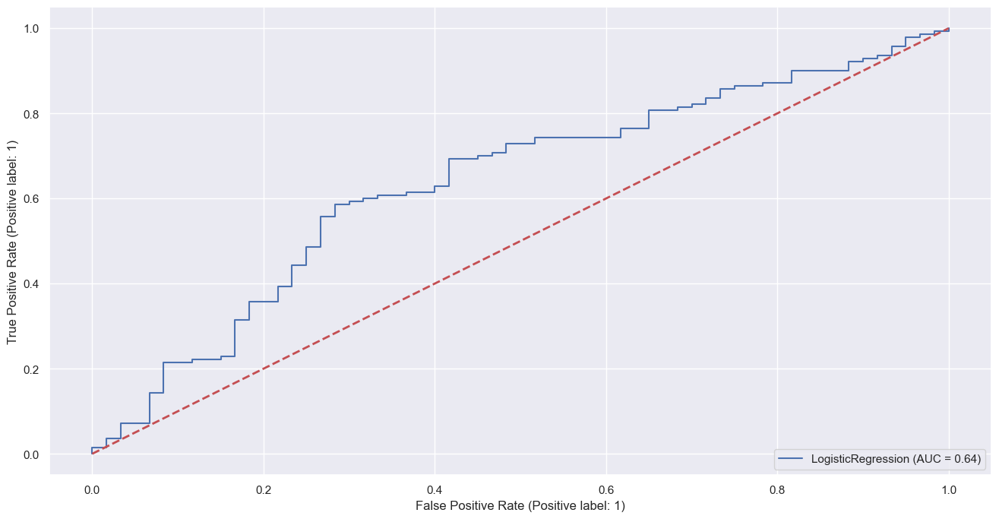

In [312]:
RocCurveDisplay.from_estimator(lr_best_grid, X_test, y_test)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random guess')
plt.show()

# Train validation test pipeline for Random Forest

In [90]:
kf = KFold(n_splits=10, shuffle=False)

In [91]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
cross_val_score(rf, X_train, y_train, cv=kf, scoring='roc_auc')

array([0.58659875, 0.7732042 , 0.58072727, 0.59398242, 0.68145161,
       0.70307692, 0.73746082, 0.58919437, 0.64457418, 0.68304843])

In [92]:
params = {
    'n_estimators': [50, 75, 100, 150, 200],
    'max_depth': [4, 6, 10, 12, 15],
    'random_state': [42]
}

grid_no_up = GridSearchCV(rf, param_grid=params, cv=kf, 
                          scoring='roc_auc').fit(X_train, y_train)

grid_no_up.best_score_

0.6836074099815096

In [93]:
roc_auc_score(y_test, grid_no_up.predict(X_test))

0.575

In [94]:
from imblearn.pipeline import Pipeline, make_pipeline

In [95]:
imba_pipeline = make_pipeline(RandomOverSampler(random_state=42), 
                              RandomForestClassifier(n_estimators=100, random_state=42))
cross_val_score(imba_pipeline, X_train, y_train, scoring='roc_auc', cv=kf)

array([0.58268025, 0.77845036, 0.59418182, 0.5520622 , 0.68951613,
       0.70820513, 0.78056426, 0.57896419, 0.61675824, 0.66346154])

In [96]:
new_params = {'randomforestclassifier__' + key: params[key] for key in params}
grid_imba = GridSearchCV(imba_pipeline, param_grid=new_params, cv=kf, scoring='roc_auc',
                        return_train_score=True)
grid_imba.fit(X_train, y_train);

In [97]:
grid_imba.best_params_

{'randomforestclassifier__max_depth': 6,
 'randomforestclassifier__n_estimators': 200,
 'randomforestclassifier__random_state': 42}

In [98]:
grid_imba.best_score_

0.6784356108960519

In [99]:
y_test_predict = grid_imba.predict(X_test)
roc_auc_score(y_test, y_test_predict)

0.638095238095238

In [100]:
y_test_predict = grid_imba.best_estimator_.named_steps['randomforestclassifier'].predict(X_test)
roc_auc_score(y_test, y_test_predict)

0.638095238095238

In [101]:
grid_imba.best_estimator_.named_steps['randomforestclassifier']

RandomForestClassifier(max_depth=6, n_estimators=200, random_state=42)

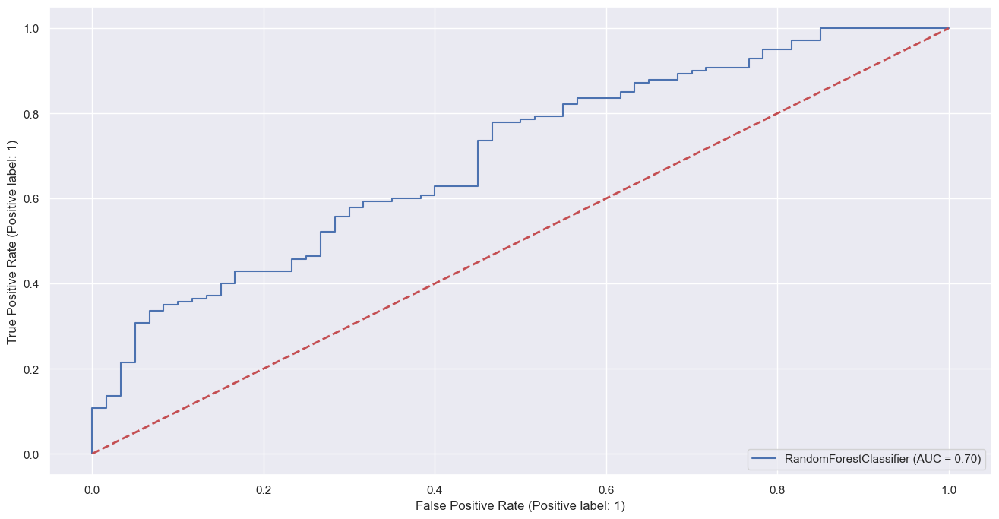

In [102]:
RocCurveDisplay.from_estimator(grid_imba.best_estimator_.named_steps['randomforestclassifier'], X_test, y_test)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random guess')
plt.show()

In [103]:
print(fbeta_score(y_test, y_test_predict, beta=0.5))
print(fbeta_score(y_test, y_test_predict, beta=2))

0.778443113772455
0.7514450867052023


In [105]:
t = RandomForestClassifier(max_depth=6, n_estimators=200, random_state=42)

t.fit(X_train_res, y_train_res)

pr = t.predict(X_test)

print(roc_auc_score(y_test, pr))

0.638095238095238


# RFE

In [103]:
rf_rfe = RandomForestClassifier(random_state=42)

In [104]:
X_train_res.shape

(1120, 9)

In [105]:
y_train_res.shape

(1120,)

In [106]:
# skb_rfe = SelectKBest()
# skb_rfe.fit()
n_features_to_select = 4

rfe = RFE(rf_rfe, n_features_to_select = n_features_to_select)

rfe.fit(X_train_res, y_train_res)

rfe.get_support()

array([ True, False, False, False, False, False,  True,  True,  True])

In [107]:
out = pd.DataFrame({'Features': X_train_res.columns[rfe.get_support()]})

dataframe_columns = pd.DataFrame(X_train_res.columns)
ranking = pd.concat([dataframe_columns], axis=1)
ranking.columns = ["Features"]

ranking[rfe.get_support()]

,Features
0,Age
6,Credit amount
7,Duration
8,Purpose


In [177]:
Z = pdist(german, metric='euclidean')

In [178]:
Z.shape

(499500,)

In [179]:
Z_matrix = squareform(Z)

In [180]:
Z_matrix.shape

(1000, 1000)